In [1]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats
from numpy import log
import ultranest
from ultranest.plot import cornerplot
from scipy.stats import poisson
from scipy.stats import norm
import pandas as pd
import healpy as hp
from healpy.newvisufunc import projview, newprojplot
import astropy.units as u
from numpy import pi, sin

# UltraNest Tutorial

## Basic Usage

### Generate Data:

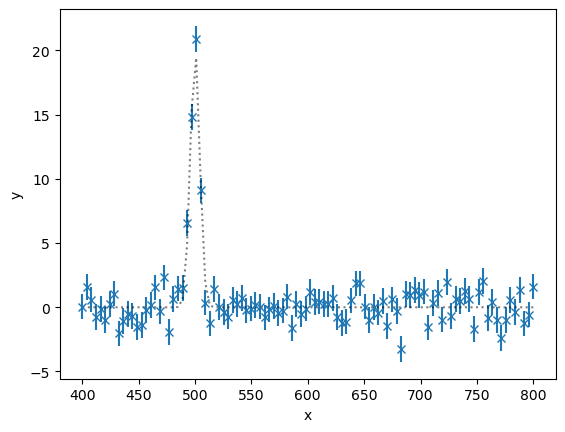

In [2]:
x = np.linspace(400, 800, 100)
yerr = 1.0
y = np.random.normal(20 * np.exp(-0.5 * ((x-500)/4.2)**2), yerr)

plt.errorbar(x, y, yerr=yerr, ls=' ', marker='x')
plt.plot(x, 20 * np.exp(-0.5 * ((x-500)/4.2)**2), ls=':', alpha=0.5, color='k')
plt.xlabel('x')
plt.ylabel('y')
plt.show()

### Name the parameters:

In [3]:
param_names = ['location', 'amplitude', 'width']

### Define priors and likelihood:

In [4]:

def my_prior_transform(cube):
    params = cube.copy()

    # transform location parameter: uniform prior
    lo = 400
    hi = 800
    params[0] = cube[0] * (hi - lo) + lo

    # transform amplitude parameter: log-uniform prior
    lo = 0.1
    hi = 100
    params[1] = 10**(cube[1] * (np.log10(hi) - np.log10(lo)) + np.log10(lo))

    # More complex prior, you can use the ppf functions
    # from scipy.stats, such as scipy.stats.norm(mean, std).ppf

    # transform for width:
    # a log-normal centered at 1 +- 1dex
    params[2] = 10**scipy.stats.norm.ppf(cube[2], 0, 1)

    return params

def my_likelihood(params):
    location, amplitude, width = params
    # compute intensity at every x position according to the model
    y_model = amplitude * np.exp(-0.5 * ((x - location)/width)**2)
    # compare model and data with gaussian likelihood:
    like = -0.5 * (((y_model - y)/yerr)**2).sum()
    return like

### Define and run the sampler, then print the results:

In [5]:
sampler = ultranest.ReactiveNestedSampler(param_names, my_likelihood, my_prior_transform)
result = sampler.run()
sampler.print_results()

[ultranest] Sampling 400 live points from prior ...


[ultranest] Explored until L=-6e+01   [-58.6132..-58.6130]*| it/evals=4640/16681 eff=27.4246% N=225      
[ultranest] Likelihood function evaluations: 16697
[ultranest]   logZ = -73.79 +- 0.2134
[ultranest] Effective samples strategy satisfied (ESS = 1067.8, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.11 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 223 minimum live points (dlogz from 0.18 to 0.52, need <0.5)
[ultranest]   logZ error budget: single: 0.25 bs:0.21 tail:0.01 total:0.21 required:<0.50
[ultranest] done iterating.

logZ = -73.748 +- 0.389
  single instance: logZ = -73.748 +- 0.185
  bootstrapped   : logZ = -73.792 +- 0.389
  tail           : logZ = +- 0.010
insert order U test : converged: True correlation: inf iterations

    location            : 499.06│ ▁▁▁▁▁▁▁▁▂▂▂▃▃▄▅▆▇▆▆▆▇▅▅▄▄▂▃▂▁▁▁▁▁▁▁▁▁ │500.62    499.84 +- 0.21
    amplitude           : 17.32 │ ▁▁▁▁▁▁▁▁▁▂▂▂▃▄▅▅▇▇▇▅▇▅▄▅▄▃▃▂▁▂▁▁▁▁▁▁▁ │23.84     20.67 +- 0.92
  

### Create Corner Plot:

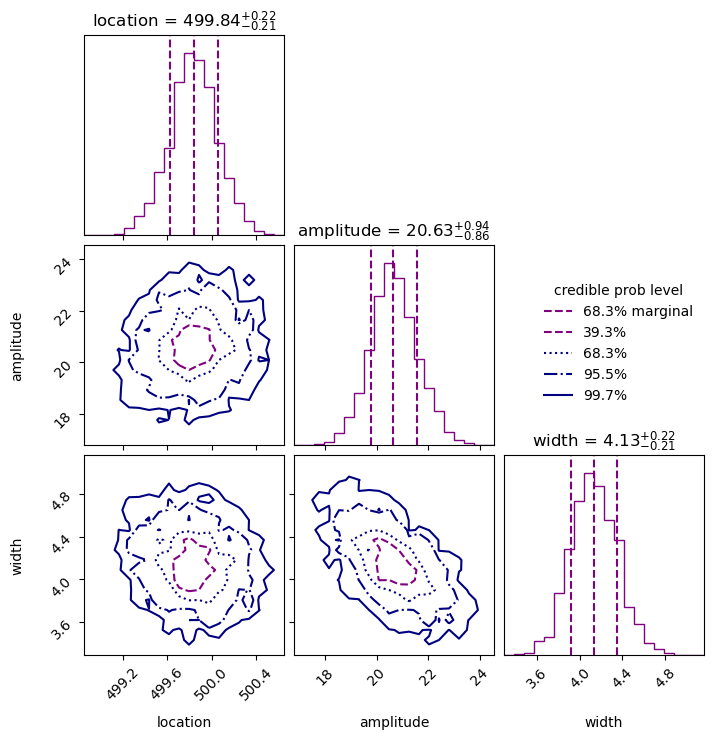

In [6]:
sampler.plot_corner()
# plt.savefig('../Figures/UN_CP_1.png', dpi=300)

### More plots:

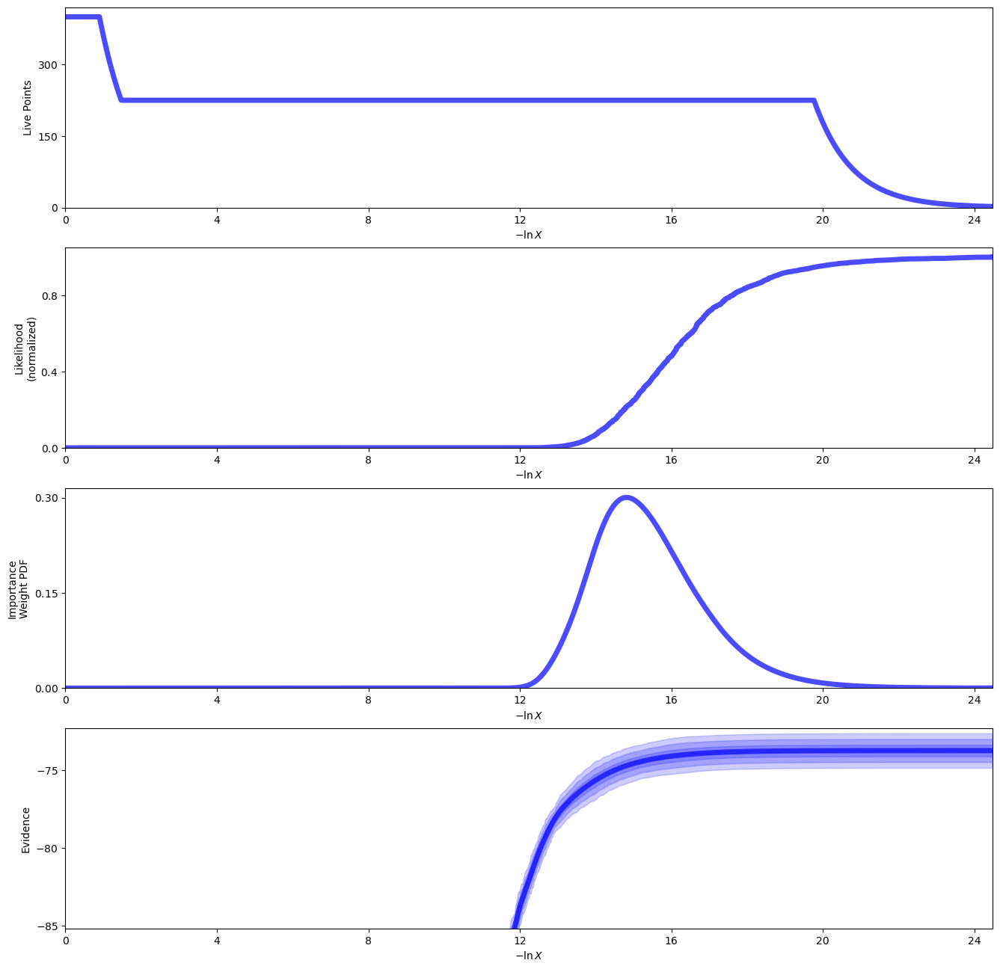

In [7]:
sampler.plot_run()

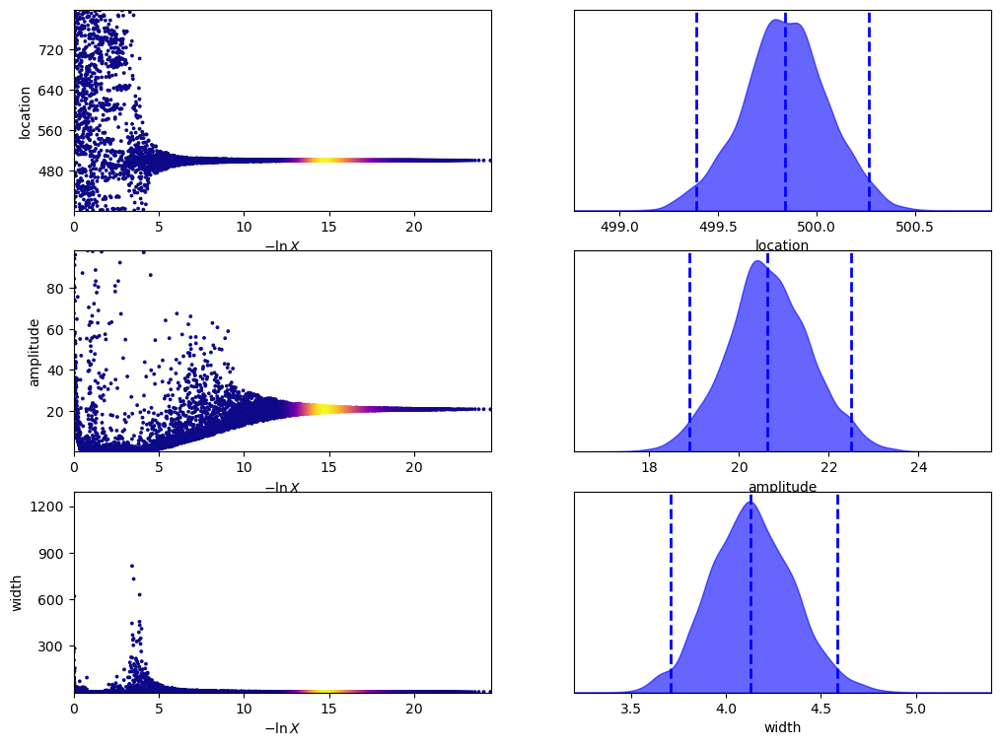

In [8]:
sampler.plot_trace()

## Model Comparison Tutorial

### Define models: 
### Model 1: $A_1 \sin(2\pi (\frac{t}{P_1} + t_1)) + B + \epsilon$ (periodic w/ Gaussian measurement errors $\epsilon$ ) where B is the signal offset, A the amplitude, P the period and $t_1$ the time offset
### Model 2: Pure Noise 

In [9]:
def sine_model1(t, B, A1, P1, t1):
    return A1 * sin((t / P1 + t1) * 2 * pi) + B

def sine_model0(t, B):
    return B + t*0

### Generate Data:

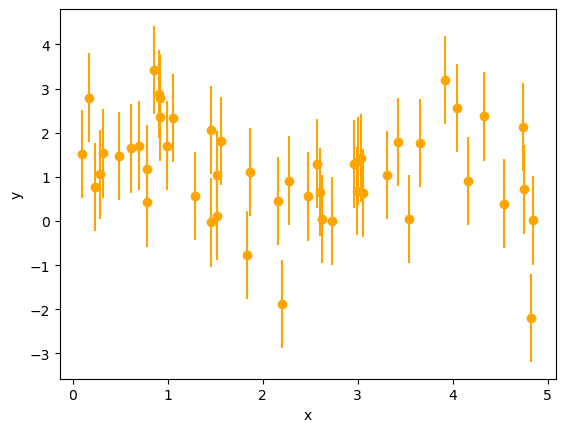

In [10]:
np.random.seed(42)

n_data = 50

# time of observations
t = np.random.uniform(0, 5, size=n_data)
# measurement values
yerr = 1.0
y = np.random.normal(sine_model1(t, B=1.0, A1=0.9, P1=3, t1=0), yerr)

plt.figure()
plt.xlabel('x')
plt.ylabel('y')
plt.errorbar(x=t, y=y, yerr=yerr,
             marker='o', ls=' ', color='orange')
t_range = np.linspace(0, 5, 1000)

In [11]:
parameters1 = ['B', 'A1', 'P1', 't1']

def prior_transform1(cube):
    # the argument, cube, consists of values from 0 to 1
    # we have to convert them to physical scales

    params = cube.copy()
    # let background level go from -10 to +10
    params[0] = cube[0] * 20 - 10
    # let amplitude go from 0.1 to 100
    params[1] = 10**(cube[1] * 3 - 1)
    # let period go from 1 to 100
    params[2] = 10**(cube[2] * 2)
    # let time go from 0 to 1
    params[3] = cube[3]
    return params

parameters0 = ['B']

def prior_transform0(cube):
    # the argument, cube, consists of values from 0 to 1
    # we have to convert them to physical scales

    params = cube.copy()
    # let background level go from -10 to +10
    params[0] = cube[0] * 20 - 10
    return params

### Define Likelihood functions assuming Gaussian measurement errors of a known size yerr:

In [12]:
def log_likelihood1(params):
    # unpack the current parameters:
    B, A1, P1, t1 = params

    # compute for each x point, where it should lie in y
    y_model = sine_model1(t, B=B, A1=A1, P1=P1, t1=t1)
    # compute likelihood
    loglike = -0.5 * (((y_model - y) / yerr)**2).sum()

    return loglike

def log_likelihood0(params):
    B, = params

    y_model = sine_model0(t, B=B)
    # compute likelihood
    loglike = -0.5 * (((y_model - y) / yerr)**2).sum()

    return loglike

### Define and run samplers:

In [13]:
sampler1 = ultranest.ReactiveNestedSampler(parameters1, log_likelihood1, prior_transform1)
result1 = sampler1.run(min_num_live_points=400)
sampler1.print_results()

[ultranest] Sampling 400 live points from prior ...


[ultranest] Explored until L=-2e+01   [-20.7390..-20.7389]*| it/evals=6760/180236 eff=3.7590% N=400    00  
[ultranest] Likelihood function evaluations: 180301
[ultranest]   logZ = -33.02 +- 0.09071
[ultranest] Effective samples strategy satisfied (ESS = 2576.1, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.07 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.09, need <0.5)
[ultranest]   logZ error budget: single: 0.16 bs:0.09 tail:0.01 total:0.09 required:<0.50
[ultranest] done iterating.

logZ = -33.031 +- 0.206
  single instance: logZ = -33.031 +- 0.157
  bootstrapped   : logZ = -33.024 +- 0.206
  tail           : logZ = +- 0.010
insert order U test : converged: True correlation: inf iterations

    B                   : -4.26 │ ▁ ▁ ▁▁ ▁▁▁▁▁▁▂▇▂▁▁▁▁▁▁▁▁  ▁     ▁   ▁ │9.04      1.01 +- 0.26
    A1                  : 0.10  │▁▂▄▇▇▄▁▁▁▁▁▁▁▁▁  ▁ ▁▁ ▁  ▁ ▁  ▁      ▁ │7.90      0.88 +- 0.31
    P1                  : 1.0  

In [14]:
sampler0 = ultranest.ReactiveNestedSampler(parameters0, log_likelihood0, prior_transform0)
result0 = sampler0.run(min_num_live_points=400)
sampler0.print_results()

[ultranest] Sampling 400 live points from prior ...


[ultranest] Explored until L=-3e+01   [-31.7136..-31.7136]*| it/evals=2840/3333 eff=96.8292% N=400   0 
[ultranest] Likelihood function evaluations: 3341
[ultranest]   logZ = -35.59 +- 0.04407
[ultranest] Effective samples strategy satisfied (ESS = 1243.7, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.06, need <0.5)
[ultranest]   logZ error budget: single: 0.09 bs:0.04 tail:0.04 total:0.06 required:<0.50
[ultranest] done iterating.

logZ = -35.595 +- 0.104
  single instance: logZ = -35.595 +- 0.093
  bootstrapped   : logZ = -35.592 +- 0.097
  tail           : logZ = +- 0.038
insert order U test : converged: True correlation: inf iterations

    B                   : 0.53  │ ▁    ▁▁▁▁▁▁▂▂▃▄▄▄▆▇▇▇▆▆▅▃▃▃▂▁▁▁▁▁▁▁▁▁ │1.71      1.16 +- 0.14



### Plot the parameter posterior distributions (cornerplots):

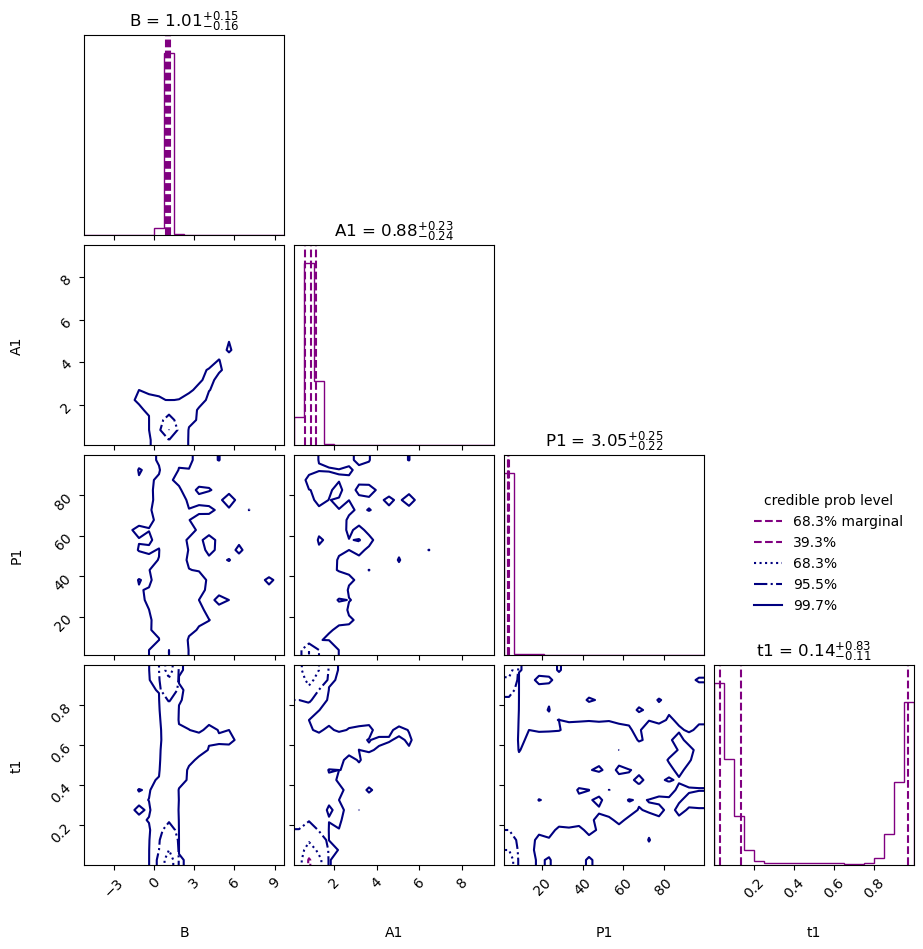

In [15]:
sampler1.plot_corner()

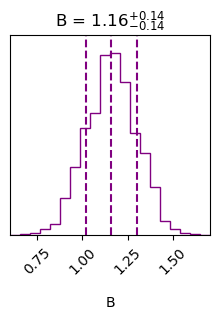

In [16]:
sampler0.plot_corner()

### Save the posterior as a dataframe:

In [17]:
import pandas as pd
df1 = pd.DataFrame(data=result1['samples'], columns=result1['paramnames'])
df1.describe()

,B,A1,P1,t1
count,7186.000000,7186.000000,7186.000000,7186.000000
mean,1.011295,0.883657,4.009451,0.456549
std,0.260764,0.306228,7.299208,0.438819
min,-3.653025,0.101055,1.066257,0.000041
25%,0.900347,0.716584,2.900699,0.044663
50%,1.005289,0.883984,3.046463,0.136783
75%,1.109289,1.030388,3.197960,0.949604
max,8.440307,7.524840,99.418826,0.999909


In [18]:
df0 = pd.DataFrame(data=result0['samples'], columns=result0['paramnames'])
df0.describe()

,B
count,3249.000000
mean,1.159903
std,0.138405
min,0.586884
25%,1.070231
50%,1.160152
75%,1.252290
max,1.658849


In [19]:
# sampler1.results['samples']

### Plot the fit:

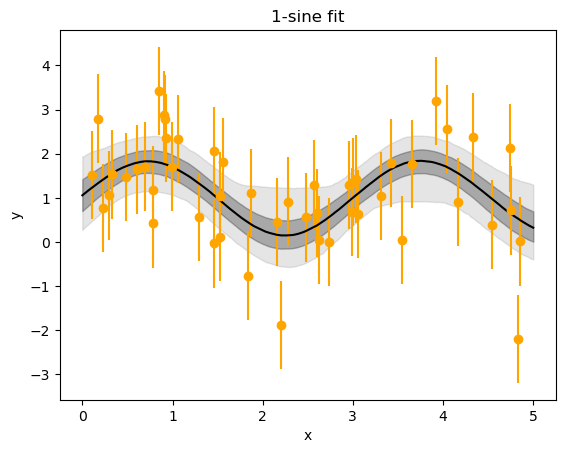

In [20]:
plt.figure()
plt.title("1-sine fit")
plt.xlabel('x')
plt.ylabel('y')
plt.errorbar(x=t, y=y, yerr=yerr,
             marker='o', ls=' ', color='orange')


t_grid = np.linspace(0, 5, 400)

from ultranest.plot import PredictionBand
band = PredictionBand(t_grid)

# go through the solutions
for B, A1, P1, t1 in sampler1.results['samples']:
    # compute for each time the y value
    band.add(sine_model1(t_grid, B=B, A1=A1, P1=P1, t1=t1))

band.line(color='k')
# add 1 sigma quantile
band.shade(color='k', alpha=0.3)
# add wider quantile (0.01 .. 0.99)
band.shade(q=0.49, color='gray', alpha=0.2)
plt.show()
plt.close()

### Now compare the models quantitatively:

In [21]:
K = np.exp(result1['logz'] - result0['logz']) # The Bayes Factor
print("K = %.2f" % K)
print("The 1-sine model is %.2f times more probable than the no-signal model" % K)
print("assuming the models are equally probable a priori.")

K = 12.98
The 1-sine model is 12.98 times more probable than the no-signal model
assuming the models are equally probable a priori.


# Model Comparison in UltraNest of My Simulated Data

In [22]:
def get_params(dim, lower, upper):
    params = np.random.uniform(lower, upper, dim)
    return params

def data_generation(params, x):
    return sum(p * x**i for i, p in enumerate(reversed(params)))

def models(theta, dim=2):
    return sum(t * x**i for i, t in enumerate(reversed(theta)))

True parameters:  [-0.50183952  1.80285723  0.92797577  0.39463394]


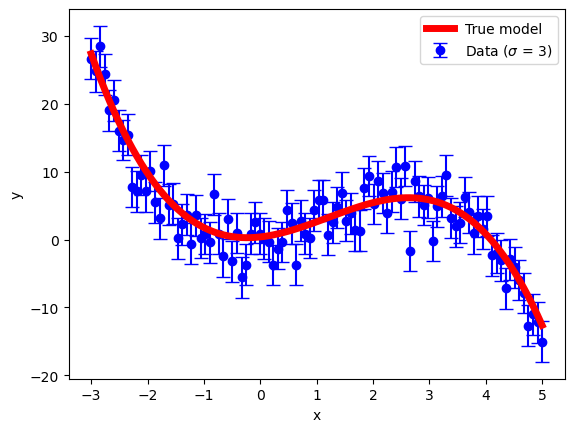

In [23]:
# Define true parameters
np.random.seed(42)

dim = 4 #Set the number of parameters (degree of polynomial = dim - 1 )
lower, upper = -2 , 2 # bounds to draw parameters from 
true_params = get_params(dim, lower, upper)
print('True parameters: ',true_params)

# Generate x values
x = np.linspace(-3, 5, 100) # set data range

# Generate y values (linear relationship with Gaussian noise)
sigma = 3
y_true = data_generation(true_params, x)
yerr = np.random.normal(scale=sigma, size=x.shape)
y = y_true + yerr

plt.errorbar(x, y, yerr=sigma, marker='o', ls='',label='Data ($\sigma$ = {:s})'.format(str(sigma)), color='blue', capsize=5, zorder=0)
plt.plot(x, y_true, label='True model', color='red', lw=5)
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
# plt.savefig('./generated_cubic_data.png', dpi=300)
plt.show()

In [24]:
parameters = ['a', 'b', 'c', 'd']

In [25]:
def poly_prior_transform(cube):
    params = cube.copy()

    return 10 * (2 * np.array(params) - 1)

def poly_likelihood(params, dim):

    y_model = models(params, dim)
    loglike = -0.5 * np.sum(((y - y_model) / sigma**2) ** 2) - 0.5* np.log(2*np.pi*sigma**2)
#     loglike = -0.5 * np.sum(((y_model - y) / yerr)**2).sum()
    return loglike

In [26]:
dim = 4
sampler = ultranest.ReactiveNestedSampler(parameters, 
                                          lambda params: poly_likelihood(params, dim),
                                          poly_prior_transform)

result = sampler.run(min_num_live_points=400)
sampler.print_results()

[ultranest] Sampling 400 live points from prior ...


[ultranest] Explored until L=-6  24 [-6.3776..-6.3774]*| it/evals=7290/14832 eff=50.5127% N=400        00     
[ultranest] Likelihood function evaluations: 14833
[ultranest]   logZ = -19.99 +- 0.1063
[ultranest] Effective samples strategy satisfied (ESS = 2108.3, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.05 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.11, need <0.5)
[ultranest]   logZ error budget: single: 0.17 bs:0.11 tail:0.01 total:0.11 required:<0.50
[ultranest] done iterating.

logZ = -19.950 +- 0.181
  single instance: logZ = -19.950 +- 0.171
  bootstrapped   : logZ = -19.987 +- 0.181
  tail           : logZ = +- 0.010
insert order U test : converged: True correlation: inf iterations

    a                   : -0.980│ ▁ ▁▁▁▁▁▁▁▁▁▁▂▃▃▄▅▆▆▇▇▇▆▅▄▄▃▂▂▁▁▁▁▁▁▁▁ │-0.207    -0.557 +- 0.088
    b                   : 0.54  │ ▁▁▁▁▁▁▁▁▁▂▂▃▄▄▅▆▇▇▇▇▇▅▄▃▃▂▂▁▁▁▁▁▁▁  ▁ │3.39      1.92 +- 0.33
    c                   : -

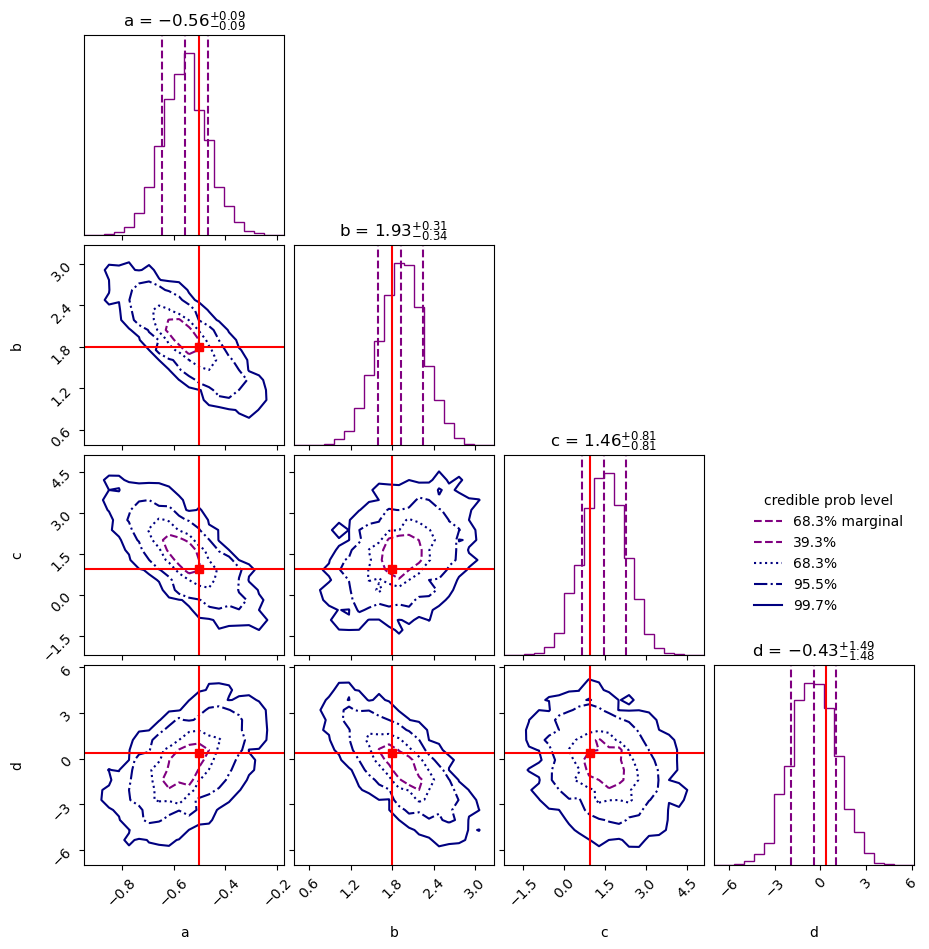

In [27]:
cornerplot(result, truths=true_params, truth_color='r')
plt.show()

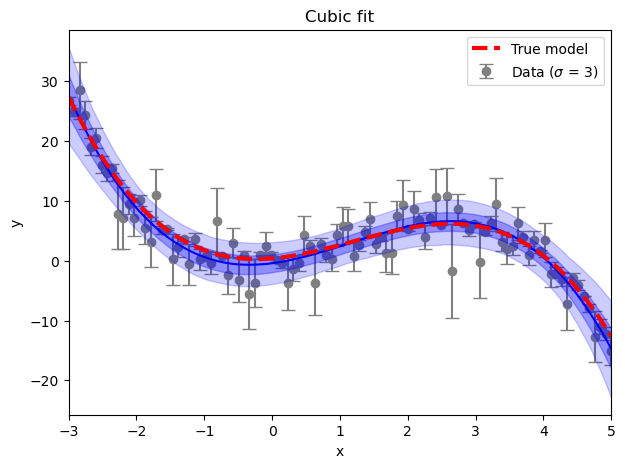

In [28]:
plt.figure(figsize=(7,5))
plt.title("Cubic fit")
plt.xlabel('x')
plt.ylabel('y')
# plt.errorbar(x=t, y=y, yerr=yerr,
#              marker='o', ls=' ', color='orange')
plt.errorbar(x, y, yerr=abs(yerr), marker='o', ls='',
             label='Data ($\sigma$ = {:s})'.format(str(sigma)), color='grey', capsize=5, zorder=0)

x_grid = np.linspace(-3, 5, 400)

from ultranest.plot import PredictionBand
band = PredictionBand(x_grid)

# go through the solutions
for model_params in sampler.results['samples']:
    # compute for each time the y value
    band.add(data_generation(model_params, x_grid))

band.line(color='b')
# add 1 sigma quantile
band.shade(color='b', alpha=0.3)
# add wider quantile (0.01 .. 0.99)
band.shade(q=0.49, color='b', alpha=0.2)
plt.plot(x, y_true, label='True model', color='r', ls='--', lw=3)
plt.xlim(-3,5)
plt.legend()
plt.show()
plt.close()

In [29]:
def define_parameters(dim):
    return [f'a{i+1}' for i in range(dim)]

In [149]:
evidence = []
evidence_error = []
max_dim = 8 # Set the maximum number of parameters we want to model
for dim in range(1,max_dim+1):
    parameters = define_parameters(dim)
    sampler = ultranest.ReactiveNestedSampler(parameters, lambda params: poly_likelihood(params, dim),
                                         poly_prior_transform)
    result = sampler.run(min_num_live_points=1000)
    log_z, log_z_err = result['logz'], result['logzerr']
    evidence.append(log_z)
    evidence_error.append(log_z_err)

[ultranest] Sampling 1000 live points from prior ...


[ultranest] Explored until L=-4e+01   [-37.2638..-37.2638]*| it/evals=5400/6476 eff=98.6121% N=1000  
[ultranest] Likelihood function evaluations: 6525
[ultranest]   logZ = -39.47 +- 0.03323
[ultranest] Effective samples strategy satisfied (ESS = 3101.3, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.05 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.05, need <0.5)
[ultranest]   logZ error budget: single: 0.04 bs:0.03 tail:0.04 total:0.05 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 1000 live points from prior ...


[ultranest] Explored until L=-3e+01   [-26.1290..-26.1289]*| it/evals=9900/13072 eff=82.0080% N=1000  
[ultranest] Likelihood function evaluations: 13109
[ultranest]   logZ = -31.46 +- 0.0431
[ultranest] Effective samples strategy satisfied (ESS = 4043.5, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.04 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.04, need <0.5)
[ultranest]   logZ error budget: single: 0.07 bs:0.04 tail:0.01 total:0.04 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 1000 live points from prior ...


[ultranest] Explored until L=-3e+01   [-25.2696..-25.2696]*| it/evals=13600/21360 eff=66.7976% N=1000     
[ultranest] Likelihood function evaluations: 21409
[ultranest]   logZ = -34.27 +- 0.06506
[ultranest] Effective samples strategy satisfied (ESS = 4738.9, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.05 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.07, need <0.5)
[ultranest]   logZ error budget: single: 0.09 bs:0.07 tail:0.01 total:0.07 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 1000 live points from prior ...


[ultranest] Explored until L=-6  25 [-6.3881..-6.3881]*| it/evals=17920/30568 eff=60.6061% N=1000 0 0 0    0   
[ultranest] Likelihood function evaluations: 30625
[ultranest]   logZ = -19.68 +- 0.1056
[ultranest] Effective samples strategy satisfied (ESS = 5349.0, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.05 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.11, need <0.5)
[ultranest]   logZ error budget: single: 0.11 bs:0.11 tail:0.01 total:0.11 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 1000 live points from prior ...


[ultranest] Explored until L=-6  24 [-6.5330..-6.5328]*| it/evals=23000/48632 eff=48.2869% N=1000 00         0   0  0 
[ultranest] Likelihood function evaluations: 48745
[ultranest]   logZ = -24.88 +- 0.08205
[ultranest] Effective samples strategy satisfied (ESS = 5937.2, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.05 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.08, need <0.5)
[ultranest]   logZ error budget: single: 0.13 bs:0.08 tail:0.01 total:0.08 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 1000 live points from prior ...


[ultranest] Explored until L=-6  25 [-6.6396..-6.6395]*| it/evals=28800/69101 eff=42.2901% N=1000 00          0  0   0   0 
[ultranest] Likelihood function evaluations: 69168
[ultranest]   logZ = -30.78 +- 0.129
[ultranest] Effective samples strategy satisfied (ESS = 6274.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.04 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.13, need <0.5)
[ultranest]   logZ error budget: single: 0.15 bs:0.13 tail:0.01 total:0.13 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 1000 live points from prior ...


[ultranest] Explored until L=-6  27 [-6.8126..-6.8126]*| it/evals=35261/102689 eff=34.6753% N=1000 0     0   00   0   0    0  
[ultranest] Likelihood function evaluations: 102740
[ultranest]   logZ = -37.35 +- 0.1373
[ultranest] Effective samples strategy satisfied (ESS = 6855.7, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.05 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.14, need <0.5)
[ultranest]   logZ error budget: single: 0.17 bs:0.14 tail:0.01 total:0.14 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 1000 live points from prior ...
[ultranest] Explored until L=-6  48 [-8.0747..-8.0738]*| it/evals=38976/156678 eff=25.0363% N=1000 00          0       0   0  
[ultranest] Likelihood function evaluations: 156678
[ultranest]   logZ = -44.57 +- 0.1047
[ultranest] Effective samples strategy satisfied (ESS = 6533.5, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.03 n

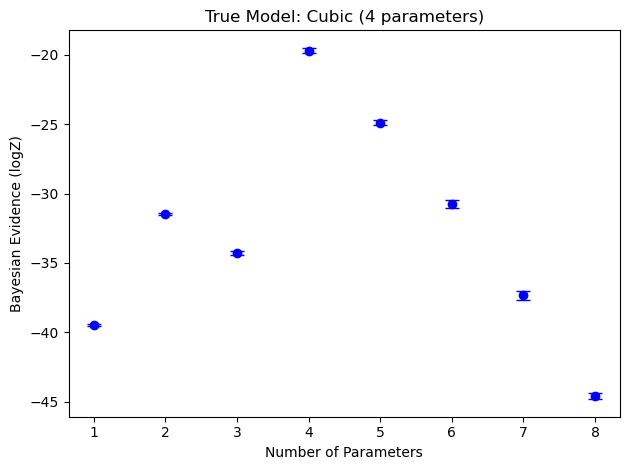

In [151]:
plt.errorbar(range(1,max_dim+1), evidence, yerr=evidence_error,
             marker='o', ls='',label='Data', color='blue', capsize=5)

plt.xlabel('Number of Parameters')
plt.ylabel('Bayesian Evidence (logZ)')
plt.title('True Model: Cubic (4 parameters)')
plt.tight_layout()
# plt.savefig('../Ultranest_polynomial_evidence.png',dpi=300)

### Periodic Data

In [30]:
def periodic_get_params(dim, lower, upper):
    params = np.random.uniform(lower, upper, dim)
    return params

def periodic_prior_transform(cube):
    params = cube.copy()
    return 3 * (np.array(params))


# Asin(Bx) + C
def periodic_data_generation(params, x):
    return params[0]*np.sin(params[1]*x) + params[2]

def periodic_likelihood(params):
    A, B, c = params
    y_model = A*np.sin(B*x) + c  # change model function to the desired one
    return -0.5 * np.sum(((y - y_model) / sigma) ** 2) - 0.5* np.log(2*np.pi*sigma**2)


# Asin(Bx)+Ccos(Dx)+E
def complex_periodic_data_generation(params, x):
    return params[0]*np.sin(params[1]*x) + params[2]*np.cos(params[3]*x) + params[4] 

def complex_periodic_likelihood(params):
    A, B, C, D, E = params
    y_model = A*np.sin(B*x) + C*np.cos(D*x) + E   # change model function to the desired one
    return -0.5 * np.sum(((y - y_model) / 0.5) ** 2) - 0.5*np.log(2*np.pi*0.5**2)

True parameters:  [0.74908024 1.90142861 1.46398788]


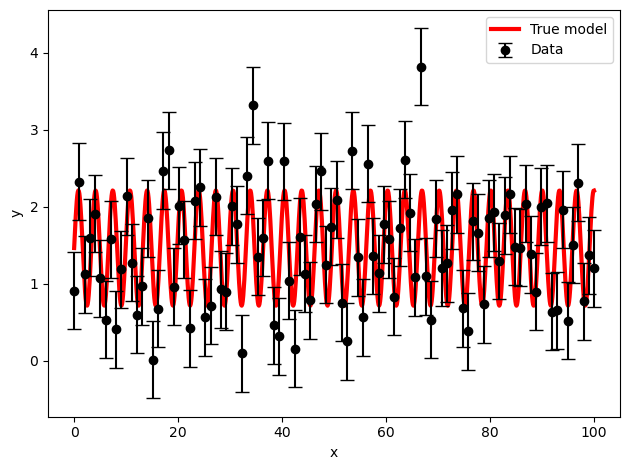

In [31]:
# Define true parameters
np.random.seed(42)
dim = 3
lower, upper = 0 , 2
true_params = periodic_get_params(dim, lower, upper)
print('True parameters: ',true_params)
# Generate x values
x = np.linspace(0, 100, 100)

# Generate y values (linear relationship with Gaussian noise)
y_true = periodic_data_generation(true_params, x)

sigma=0.5
yerr = np.random.normal(scale=sigma, size=x.shape)
y = y_true + yerr # Adding Gaussian noise

plt.errorbar(x, y, yerr=sigma, marker='o', ls='',label='Data', color='k', capsize=5)
x_true_model = np.linspace(0, 100, 1000) 
y_true_model = periodic_data_generation(true_params, x_true_model)
plt.plot(x_true_model, y_true_model, label='True model', color='r', lw=3, ls='-', zorder=0)
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.tight_layout()
# plt.savefig('../Figures/simple_periodic_data_generation.png', dpi=300)
plt.show()

In [32]:
dim=3

parameters = ['A', 'B', 'C']
periodic_sampler = ultranest.ReactiveNestedSampler(parameters, periodic_likelihood,
                                     periodic_prior_transform)
periodic_result = periodic_sampler.run(min_num_live_points=1000)


[ultranest] Sampling 1000 live points from prior ...


[ultranest] Explored until L=-5e+01   [-52.7244..-52.7244]*| it/evals=17200/168176 eff=10.2886% N=1000   
[ultranest] Likelihood function evaluations: 168187
[ultranest]   logZ = -65.3 +- 0.07791
[ultranest] Effective samples strategy satisfied (ESS = 4667.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.04 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.08, need <0.5)
[ultranest]   logZ error budget: single: 0.11 bs:0.08 tail:0.01 total:0.08 required:<0.50
[ultranest] done iterating.


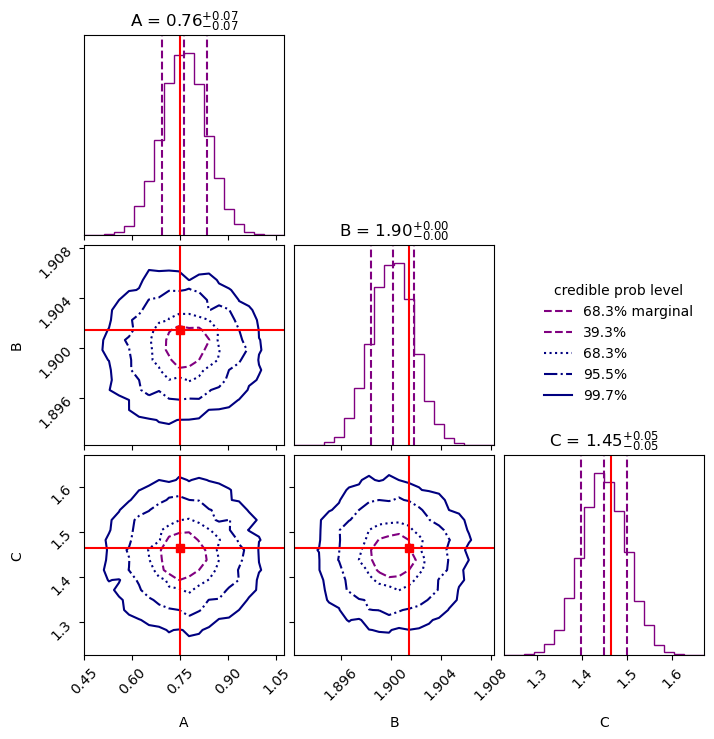

In [33]:
cornerplot(periodic_result, truths=true_params, truth_color='r')
plt.show()

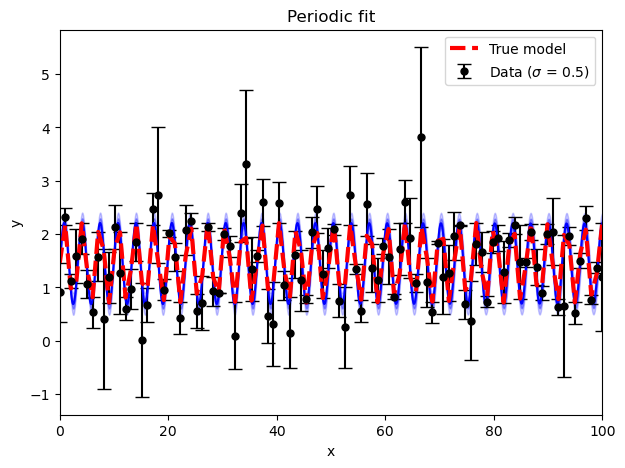

In [34]:
plt.figure(figsize=(7,5))
plt.title("Periodic fit")
plt.xlabel('x')
plt.ylabel('y')
plt.errorbar(x, y, yerr=abs(yerr), marker='o', markersize=5, ls='',
             label='Data ($\sigma$ = {:s})'.format(str(sigma)), color='k', capsize=5)
# plt.plot(x_true_model, y_true_model, label='True model', color='red', lw=3)

x_grid = np.linspace(0, 100, 1000)

from ultranest.plot import PredictionBand
band = PredictionBand(x_grid)

# go through the solutions
for model_params in periodic_sampler.results['samples']:
    # compute for each time the y value
    band.add(periodic_data_generation(model_params, x_grid))

band.line(color='b')
# add 1 sigma quantile
band.shade(color='b', alpha=0.3)
# add wider quantile (0.01 .. 0.99)
band.shade(q=0.49, color='b', alpha=0.2)
plt.plot(x, y_true, label='True model', color='r', ls='--', lw=3)
plt.xlim(0,100)
plt.legend()
plt.show()
plt.close()

True parameters:  [0.74908024 1.90142861 1.46398788 1.19731697 0.31203728]


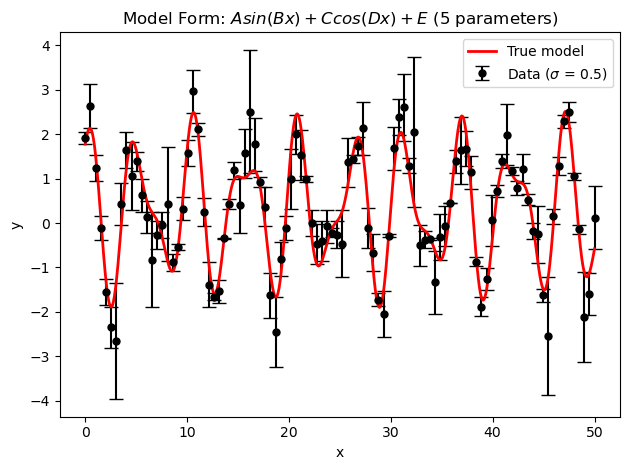

In [35]:
# Define true parameters
np.random.seed(42)
dim = 5
lower, upper = 0 , 2
true_params = get_params(dim, lower, upper)
print('True parameters: ',true_params)

# Generate data points
x = np.linspace(0, 50, 100)
y_true = complex_periodic_data_generation(true_params, x)
yerr = np.random.normal(scale=0.5, size=x.shape)
y = y_true + yerr  # Adding Gaussian noise
plt.errorbar(x, y, yerr=abs(yerr), marker='o', markersize=5, ls='',
             label='Data ($\sigma$ = {:s})'.format(str(sigma)), color='k', capsize=5)

#true model
x_true_model = np.linspace(0,50,1000)
y_true_model = complex_periodic_data_generation(true_params, x_true_model)
plt.plot(x_true_model, y_true_model, label='True model', color='red', lw=2)
plt.xlabel('x')
plt.ylabel('y')
plt.title(r'Model Form: $Asin(Bx) + Ccos(Dx) + E$ (5 parameters)')
plt.legend()
plt.tight_layout()
# plt.savefig('../Figures/complex_periodic_data_generation.png',dpi=300)
plt.show()


In [40]:
dim=5

parameters = ['A', 'B', 'C', 'D', 'E']
complex_periodic_sampler = ultranest.ReactiveNestedSampler(parameters, complex_periodic_likelihood,
                                     periodic_prior_transform)
complex_periodic_result = complex_periodic_sampler.run(min_num_live_points=1000)

[ultranest] Sampling 1000 live points from prior ...


[ultranest] Explored until L=-5e+01   [-53.2696..-53.2695]*| it/evals=25644/948525 eff=2.7064% N=1000      
[ultranest] Likelihood function evaluations: 948539
[ultranest]   logZ = -74.24 +- 0.1101
[ultranest] Effective samples strategy satisfied (ESS = 5849.8, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.06 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.11, need <0.5)
[ultranest]   logZ error budget: single: 0.14 bs:0.11 tail:0.01 total:0.11 required:<0.50
[ultranest] done iterating.


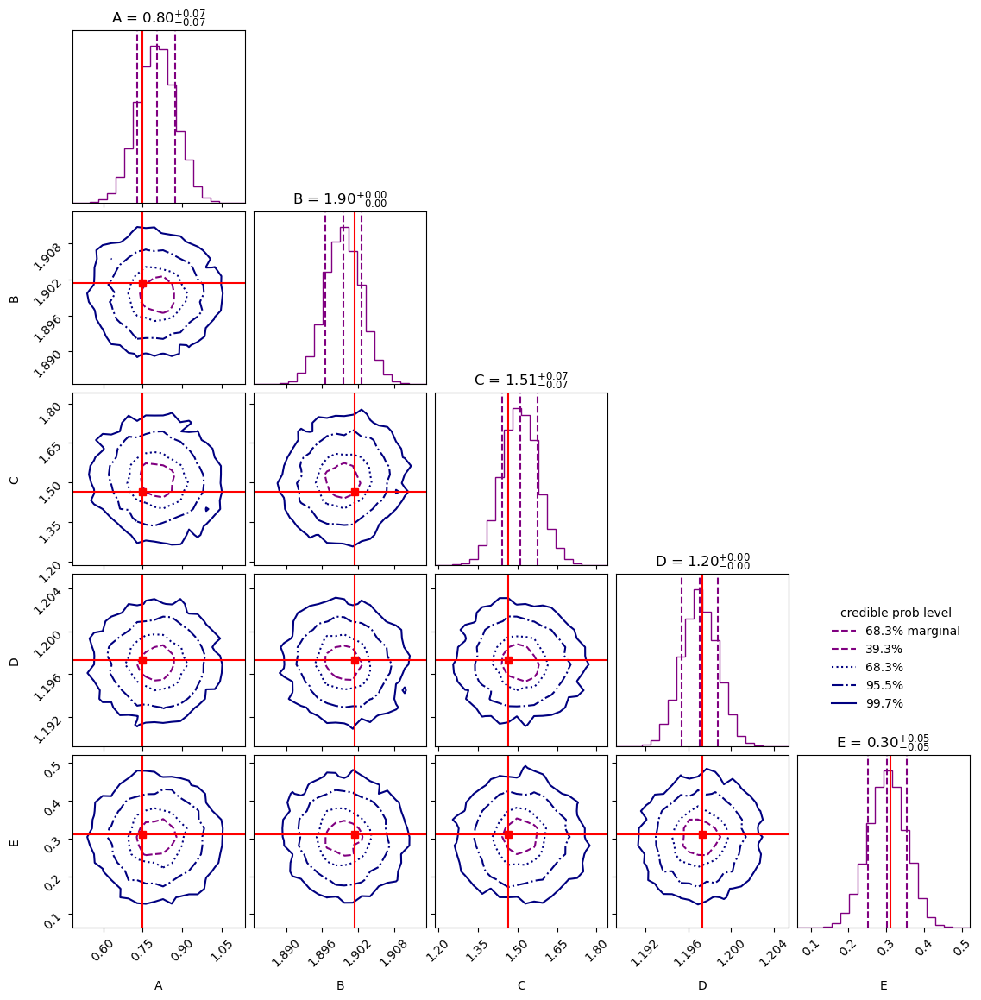

In [41]:
cornerplot(complex_periodic_result, truths=true_params, truth_color='r')
plt.show()

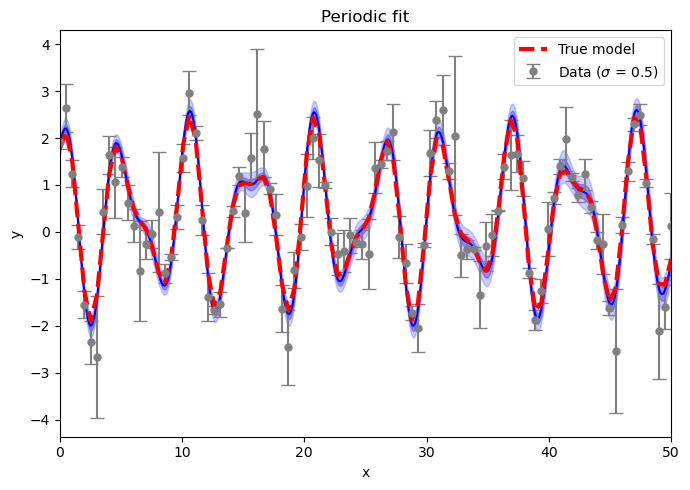

In [44]:
plt.figure(figsize=(7,5))
plt.title("Periodic fit")
plt.xlabel('x')
plt.ylabel('y')
plt.errorbar(x, y, yerr=abs(yerr), marker='o', markersize=5, ls='',
             label='Data ($\sigma$ = {:s})'.format(str(sigma)), color='grey', capsize=5)


x_grid = np.linspace(0, 50, 500)

from ultranest.plot import PredictionBand
band = PredictionBand(x_grid)

# go through the solutions
for model_params in complex_periodic_sampler.results['samples']:
    # compute for each time the y value
    band.add(complex_periodic_data_generation(model_params, x_grid))

band.line(color='b')
# add 1 sigma quantile
band.shade(color='b', alpha=0.3)
# add wider quantile (0.01 .. 0.99)
band.shade(q=0.49, color='b', alpha=0.2)
plt.plot(x, y_true, label='True model', color='r', ls='--', lw=3)
plt.xlim(0,50)
plt.legend()

plt.tight_layout()
# plt.savefig('../Figures/periodic_ultranest_fitting.png', dpi=300)
plt.show()
plt.close()

# Poisson Distribution Data

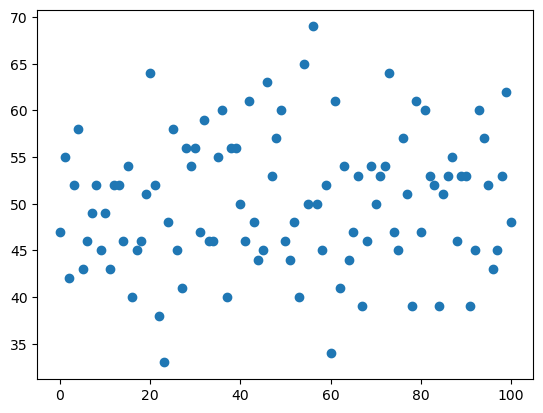

In [181]:
np.random.seed(42)

x = np.linspace(0,100,101)
lambda_true = 50
y = np.random.poisson(lambda_true, size=len(x))
plt.scatter(x,y)

In [195]:
param_names = [r'$\lambda$']

In [196]:
def my_prior_transform(cube):
    params = cube.copy()

    # transform location parameter: uniform prior
    lo = 0
    hi = 100
    params[0] = cube[0] * (hi - lo) + lo

    return params

def my_likelihood(params):
    lambda_ = params[0]

    return np.sum(poisson.logpmf(y, mu=lambda_))
    

In [201]:
sampler = ultranest.ReactiveNestedSampler(param_names, my_likelihood, my_prior_transform)
result = sampler.run()
sampler.print_results()

[ultranest] Sampling 400 live points from prior ...


[ultranest] Explored until L=-6e+02  .03 [-596.0290..-596.0290]*| it/evals=2920/3401 eff=97.3009% N=400 0 
[ultranest] Likelihood function evaluations: 3438
[ultranest]   logZ = -600.2 +- 0.07884
[ultranest] Effective samples strategy satisfied (ESS = 1271.5, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.48+-0.04 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.09, need <0.5)
[ultranest]   logZ error budget: single: 0.10 bs:0.08 tail:0.04 total:0.09 required:<0.50
[ultranest] done iterating.

logZ = -600.203 +- 0.138
  single instance: logZ = -600.203 +- 0.096
  bootstrapped   : logZ = -600.221 +- 0.132
  tail           : logZ = +- 0.039
insert order U test : converged: True correlation: inf iterations

    $\lambda$           : 42.52 │ ▁  ▁▁▁▁▁▁▂▂▂▃▄▄▆▇▇▇▇▆▆▄▅▄▄▂▂▂▁▁▁▁▁▁▁▁ │47.74     45.17 +- 0.68



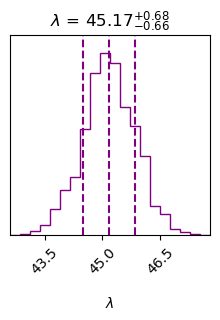

In [204]:
cornerplot(result)
plt.show()

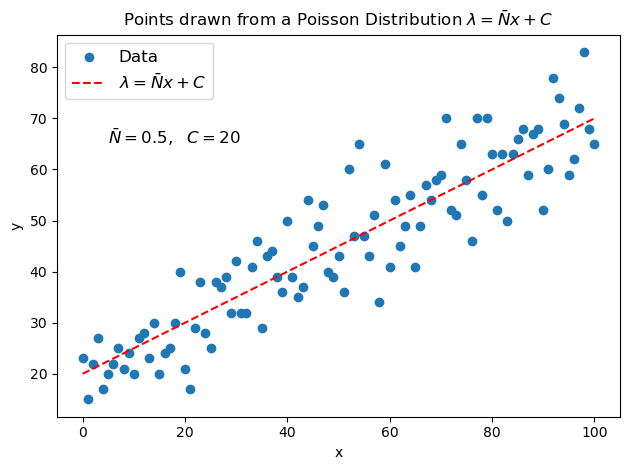

In [205]:
np.random.seed(42)

x = np.linspace(0, 100, 101)  # Independent variable
N_bar_true = 0.5
C_true = 20

lambda_true = N_bar_true * x + C_true  # Linearly varying Poisson rate
y = np.random.poisson(lambda_true, size=len(x))  # Poisson-distributed data

plt.scatter(x, y, label="Data")
plt.plot(x, lambda_true, color="r", label=r"$\lambda = \bar{N}x + C$", ls='--')
plt.xlabel("x")
plt.ylabel("y")
plt.legend(fontsize=12)

plt.title(r'Points drawn from a Poisson Distribution $\lambda =  \bar{N}x + C$')
plt.annotate(r'$\bar N = {:s},\ \ C = {:s}$'.format(str(N_bar_true), str(C_true)), xy=(5,65), fontsize=12)
plt.tight_layout()
plt.show()

In [206]:
param_names = ['N_bar', 'C']

In [207]:
def my_prior_transform(cube):
    params = cube.copy()
    
    # N prior
    lo = 0
    hi = 100
    params[0] = cube[0] * (hi - lo) + lo
    
    # C prior
    lo = 0
    hi = 100
    params[1] = cube[1] * (hi - lo) + lo
    
    return params

def my_likelihood(params):
    N_bar, C = params
    lambda_i = N_bar * x + C
    return np.sum(poisson.logpmf(y, mu=lambda_i))

In [208]:
sampler = ultranest.ReactiveNestedSampler(param_names, my_likelihood, my_prior_transform)
result = sampler.run()
sampler.print_results()

[ultranest] Sampling 400 live points from prior ...


[ultranest] Explored until L=-3e+02  .91 [-333.9261..-333.9261]*| it/evals=6400/8746 eff=76.6834% N=400 0   0  0 
[ultranest] Likelihood function evaluations: 8772
[ultranest]   logZ = -345.4 +- 0.1407
[ultranest] Effective samples strategy satisfied (ESS = 1573.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.14, need <0.5)
[ultranest]   logZ error budget: single: 0.16 bs:0.14 tail:0.01 total:0.14 required:<0.50
[ultranest] done iterating.

logZ = -345.366 +- 0.261
  single instance: logZ = -345.366 +- 0.162
  bootstrapped   : logZ = -345.368 +- 0.261
  tail           : logZ = +- 0.010
insert order U test : converged: True correlation: inf iterations

    N_bar               : 0.431 │ ▁  ▁▁▁▁▁▁▂▂▃▄▄▄▆▇▆▇▆▆▅▅▄▃▃▂▁▁▁▁▁▁▁▁▁▁ │0.606     0.518 +- 0.022
    C                   : 15.1  │ ▁▁▁▁▁▁▁▁▁▂▂▃▄▅▆▆▇▆▇▆▅▆▅▄▃▂▂▂▁▁▁▁▁▁▁ ▁ │23.7      19.3 +- 1.1



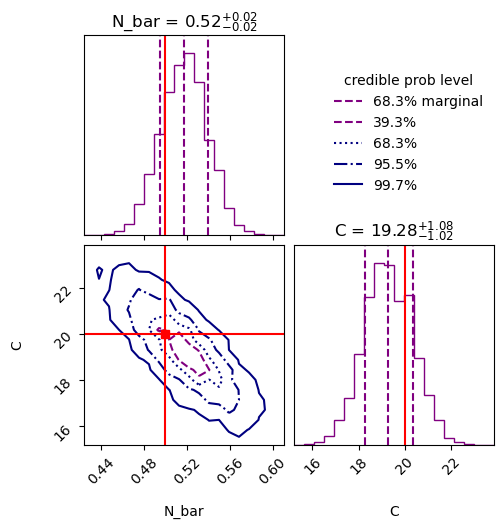

In [209]:
cornerplot(result, truths=[N_bar_true, C_true], truth_color='r')
plt.show()

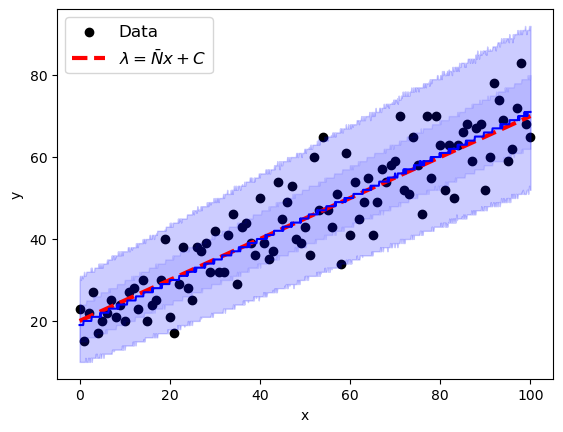

In [218]:
plt.scatter(x, y, label="Data", c='k')
plt.plot(x, lambda_true, color="r", label=r"$\lambda = \bar{N}x + C$", ls='--', lw=3)
plt.xlabel("x")
plt.ylabel("y")
plt.legend(fontsize=12)

x_grid = np.linspace(0, 100, 1000)

from ultranest.plot import PredictionBand
band = PredictionBand(x_grid)

# go through the solutions
for N_bar, C in sampler.results['samples']:
    # compute for each time the y value
    lambda_i = N_bar*x_grid + C
    band.add(np.random.poisson(lambda_i))

band.line(color='b')
# add 1 sigma quantile
band.shade(color='b', alpha=0.1)
# add wider quantile (0.01 .. 0.99)
band.shade(q=0.49, color='b', alpha=0.2)

In [2]:
def pixel_angles(pixel_vec, dipole_vec):
    dot_product = np.dot(pixel_vec, dipole_vec)
    theta = np.arccos(dot_product) # don't need the magnitude bc they are unit vectors
    return theta

def poisson_sampling(NSIDE, N_bar, D, dipole_theta, dipole_phi):
    NPIX = hp.nside2npix(NSIDE)
    pixel_vec = np.vstack(hp.pix2vec(NSIDE, np.arange(NPIX))).T
    dipole_vec = hp.ang2vec(dipole_theta, dipole_phi) # (x, y, z) from (b, l)
    
    theta_angle = pixel_angles(pixel_vec, dipole_vec)
    lambda_ = N_bar * (1 + D*np.cos(theta_angle))
    sample = np.random.poisson(lambda_)
    return sample, lambda_
        
def plotting(m, dipole_theta=None, dipole_phi=None, title=None, unit=None, cmap='viridis'):
    projview(m, title=title, unit=unit,
    graticule=True, graticule_labels=True, projection_type="mollweide", cmap=cmap);

    newprojplot(theta=dipole_theta, phi=dipole_phi, marker="*", color="k", markersize=15);
    plt.tight_layout()
#     plt.show()
#     plt.close()
    return


def omega_to_theta(omega):
    '''Convert solid angle in steradins to theta in radians for
    a cone section of a sphere. Taken from the code used in Secrest (2021),
    namely in CatWISE_Dipole_Resulys.ipynb. '''
    return np.arccos(1 - omega / (2 * np.pi)) * u.rad

def compute_smooth_map(m: np.ndarray, weights=None, angle_scale=1):
        'Smooth the map using a moving average.'
        included_pixels = np.where(~np.isnan(m))[0]
        smoothed_map = np.full(m.shape, np.nan, dtype=float)
        nside = hp.get_nside(m)
        
        if type(weights) != np.ndarray:
            weights = np.ones_like(m).astype('float')

        smoothing_radius = omega_to_theta(angle_scale).value
        for p_index in included_pixels:
            vec = hp.pix2vec(nside, p_index)
            disc = hp.query_disc(nside, vec, smoothing_radius)
            smoothed_map[p_index] = np.nanmean(m[disc].astype(float) * weights[disc].astype(float))

        return smoothed_map

In [3]:
NSIDE=64
NPIX = hp.nside2npix(NSIDE)
N_bar_true = 40
D_true = 0.007 # dipole amplitude, using value from paper

#  dipole vector
dipole_theta = np.pi/4
dipole_phi = -np.pi/2
# x_dip, y_dip, z_dip = hp.ang2vec(dipole_theta, dipole_phi) 

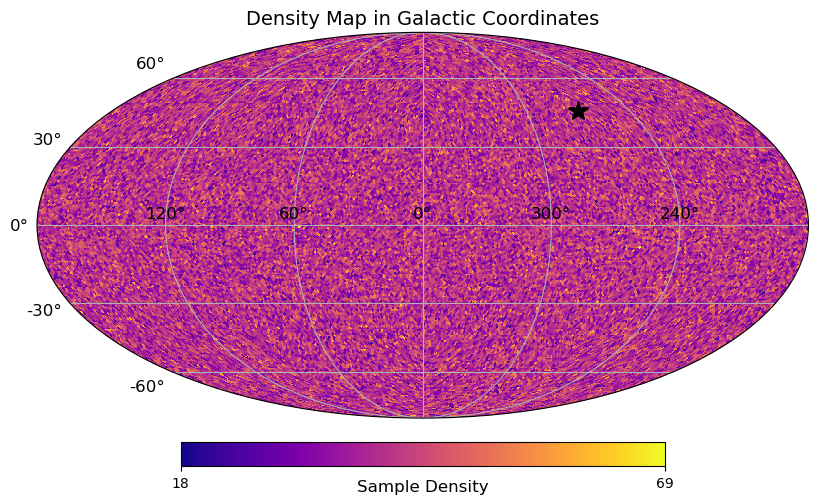

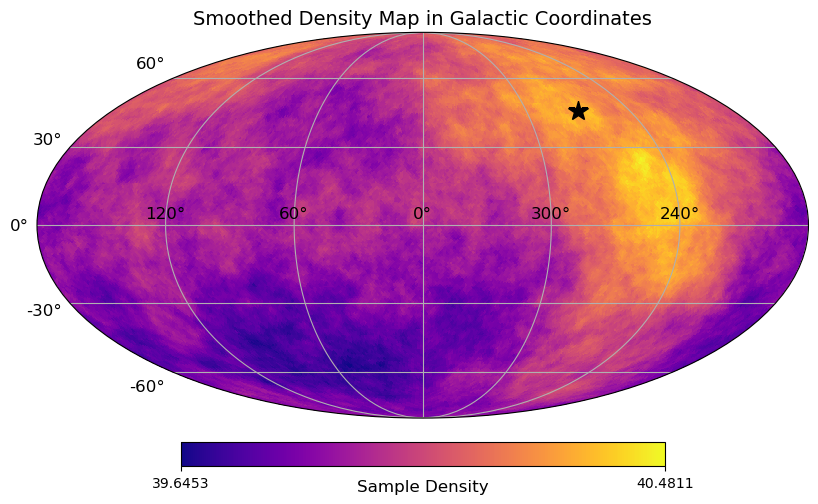

In [4]:
np.random.seed(42)
m, lambda_true_array = poisson_sampling(NSIDE=64,  N_bar=40, D=0.007, dipole_theta=np.pi/4, dipole_phi=-np.pi/2)

#Unsmoothed
plotting(m, dipole_theta, dipole_phi,
         title='Density Map in Galactic Coordinates', unit="Sample Density",
        cmap='plasma')

smoothed_map = compute_smooth_map(m, weights=None, angle_scale=1)

plotting(smoothed_map, dipole_theta, dipole_phi,
         title='Smoothed Density Map in Galactic Coordinates', unit="Sample Density",
        cmap='plasma')

In [5]:
param_names = [r'$\bar N$', 'D', r'$\ell$', 'b']

In [6]:
def my_prior_transform(cube):
    params = cube.copy()
    params[0] = cube[0]*2000 # 0 - 100
    params[1] = cube[1]/10 # 0 - 0.1
    params[2] = cube[2]*2*np.pi # 0 - 2pi
    
    c = cube[3] # 0 - 1, used to calculate theta below. 
    # Oliver uses 0 - 0.1, but this doesnt return theta between (0,pi), is it a typo or am i missing something else?
    params[3] = np.arccos(np.clip(1 - 2*c, -1, 1)) #Clipping to ensure we stay in the valid range
    
    return params
    
def my_likelihood(params):
    N_bar, D, l, b = params
    pixel_vec = np.vstack(hp.pix2vec(NSIDE, np.arange(NPIX))).T
    dipole_vec = hp.ang2vec(b, l) # dipole vector in cartesian
    angles = pixel_angles(pixel_vec, dipole_vec)
    
    lambda_i = N_bar * (1 + D*np.cos(angles))
    
    return np.sum(poisson.logpmf(m, mu=lambda_i))


In [7]:
sampler = ultranest.ReactiveNestedSampler(param_names, my_likelihood, my_prior_transform)
result = sampler.run()
sampler.print_results()

[ultranest] Sampling 400 live points from prior ...


[ultranest] Explored until L=-2e+05  ..-160364.86 [-160365.0187..-160365.0186]*| it/evals=8910/20794 eff=43.6893% N=400   0  
[ultranest] Likelihood function evaluations: 20807
[ultranest]   logZ = -1.604e+05 +- 0.1669
[ultranest] Effective samples strategy satisfied (ESS = 2206.2, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.06 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.17, need <0.5)
[ultranest]   logZ error budget: single: 0.20 bs:0.17 tail:0.01 total:0.17 required:<0.50
[ultranest] done iterating.

logZ = -160382.649 +- 0.358
  single instance: logZ = -160382.649 +- 0.198
  bootstrapped   : logZ = -160382.647 +- 0.357
  tail           : logZ = +- 0.010
insert order U test : converged: True correlation: inf iterations

    $\bar N$            : 39.889│ ▁▁▁▁▁▁▁▂▂▂▄▄▅▆▇▇▇▆▇▆▅▅▄▃▂▂▁▁▁▁▁▁▁▁  ▁ │40.123    39.997 +- 0.029
    D                   : 0.0001│ ▁▁ ▁▁▁▁▁▁▁▂▂▃▄▄▅▆▆▇▆▇▅▅▄▄▃▂▂▁▁▁▁▁▁▁ ▁ │0.0113    0.0059 +-

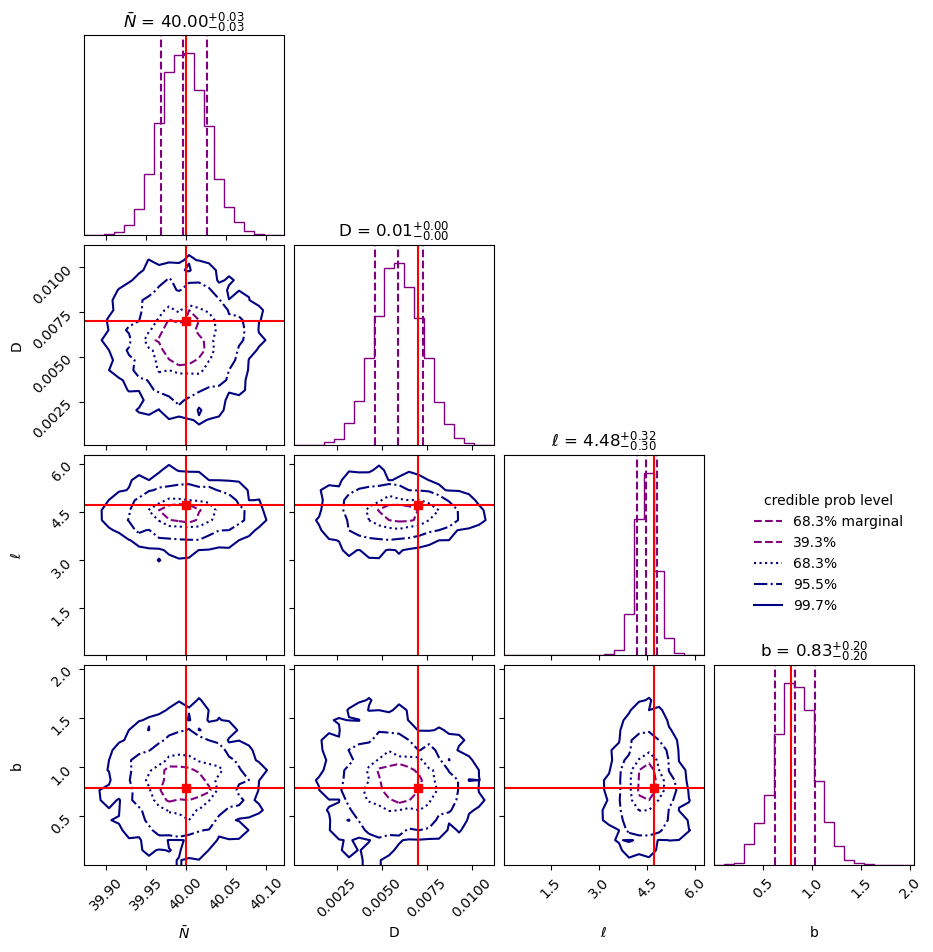

In [8]:
cornerplot(result, truths=[N_bar_true, D_true, -dipole_phi+np.pi, dipole_theta], truth_color='r')
# plt.savefig('../Figures/UN_dipole_cornerplots.png', dpi=300)
plt.show()

In [9]:
samples = result['samples']  
l_values = samples[:, 2]  
b_values = samples[:, 3] 

# Varying N_bar and NSIDE:

### NSIDE:

[ultranest] Sampling 400 live points from prior ...


[ultranest] Explored until L=-4e+03  768.74 [-3768.8950..-3768.8948]*| it/evals=7160/17162 eff=42.7157% N=400   0 
[ultranest] Likelihood function evaluations: 17228
[ultranest]   logZ = -3782 +- 0.1371
[ultranest] Effective samples strategy satisfied (ESS = 2114.0, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.07 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.14, need <0.5)
[ultranest]   logZ error budget: single: 0.17 bs:0.14 tail:0.01 total:0.14 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 400 live points from prior ...


[ultranest] Explored until L=-1e+04  -14914.11 [-14914.2538..-14914.2535]*| it/evals=8370/19041 eff=44.9010% N=400    
[ultranest] Likelihood function evaluations: 19054
[ultranest]   logZ = -1.493e+04 +- 0.1242
[ultranest] Effective samples strategy satisfied (ESS = 2155.2, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.06 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.12, need <0.5)
[ultranest]   logZ error budget: single: 0.19 bs:0.12 tail:0.01 total:0.12 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 400 live points from prior ...


[ultranest] Explored until L=-6e+04  -59813.81 [-59813.9537..-59813.9537]*| it/evals=9400/21902 eff=43.7169% N=400    0  
[ultranest] Likelihood function evaluations: 21905
[ultranest]   logZ = -5.983e+04 +- 0.1493
[ultranest] Effective samples strategy satisfied (ESS = 2062.7, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.06 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.15, need <0.5)
[ultranest]   logZ error budget: single: 0.21 bs:0.15 tail:0.01 total:0.15 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 400 live points from prior ...


[ultranest] Explored until L=-2e+05  ..-239645.23 [-239645.3806..-239645.3805]*| it/evals=10360/23432 eff=44.9809% N=400 
[ultranest] Likelihood function evaluations: 23442
[ultranest]   logZ = -2.397e+05 +- 0.1398
[ultranest] Effective samples strategy satisfied (ESS = 2113.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.05 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.14, need <0.5)
[ultranest]   logZ error budget: single: 0.22 bs:0.14 tail:0.01 total:0.14 required:<0.50
[ultranest] done iterating.


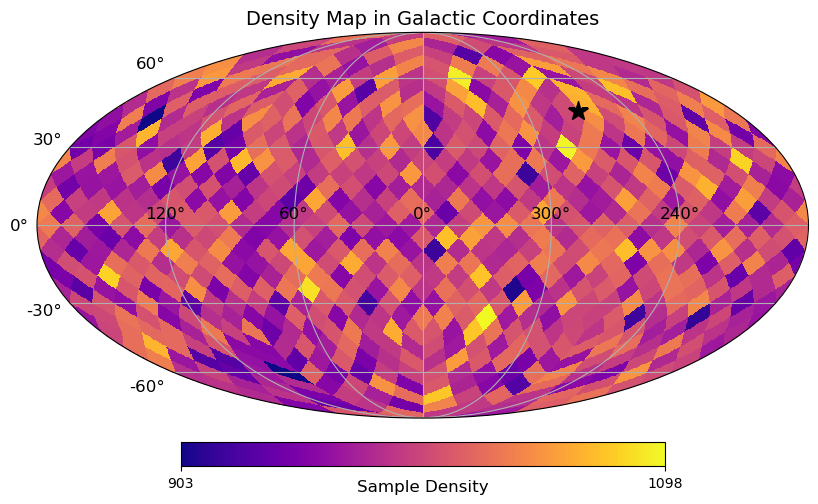

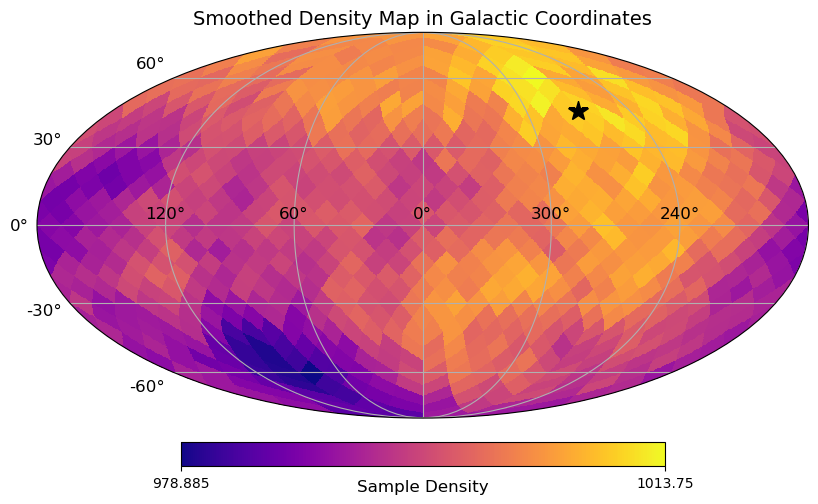

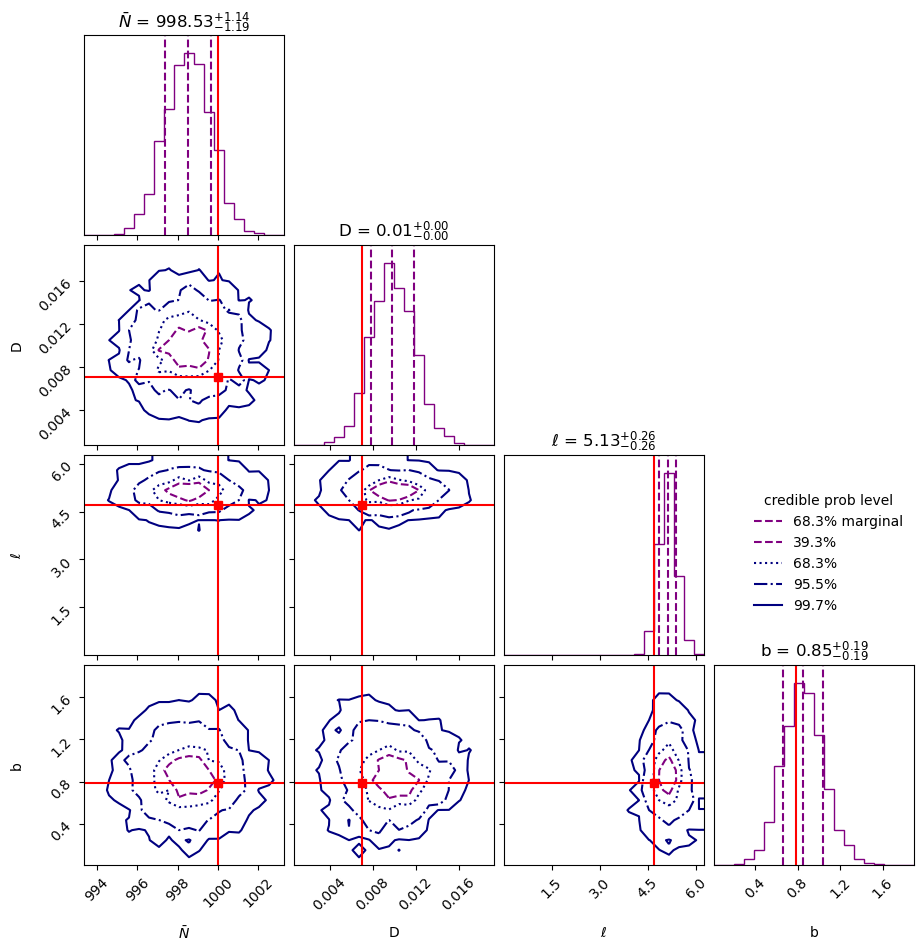

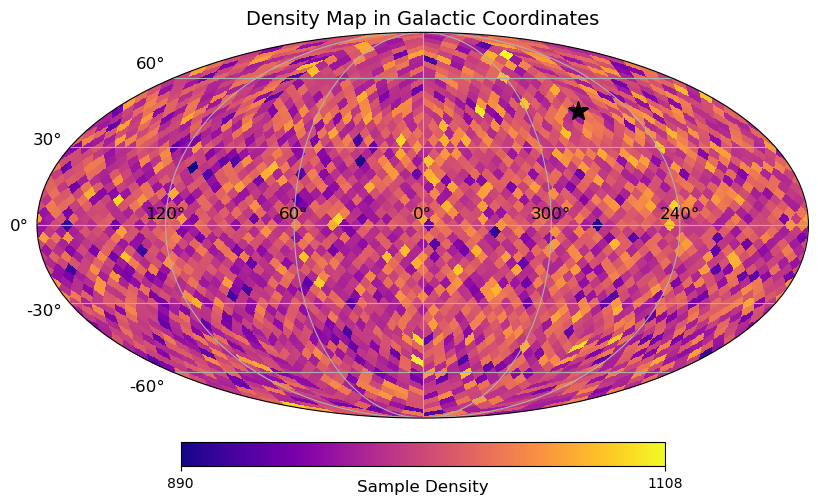

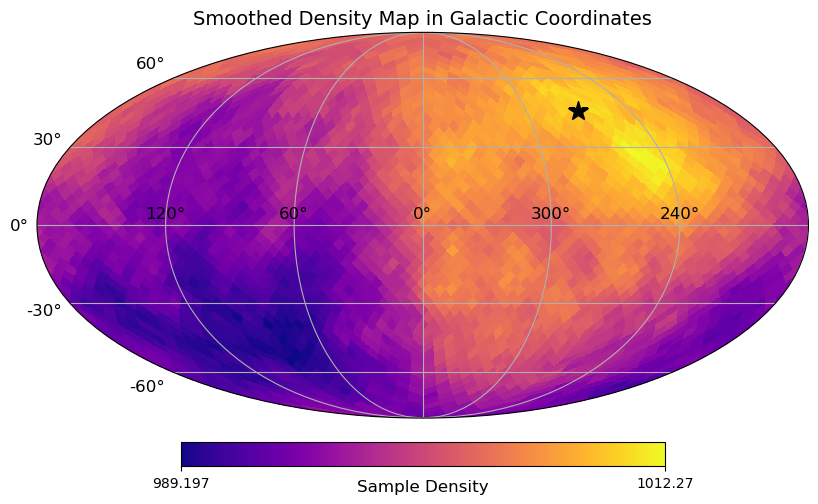

...

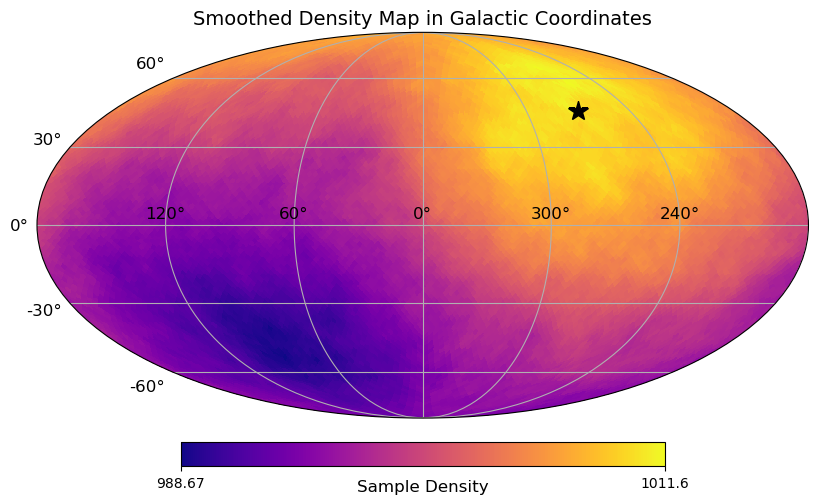

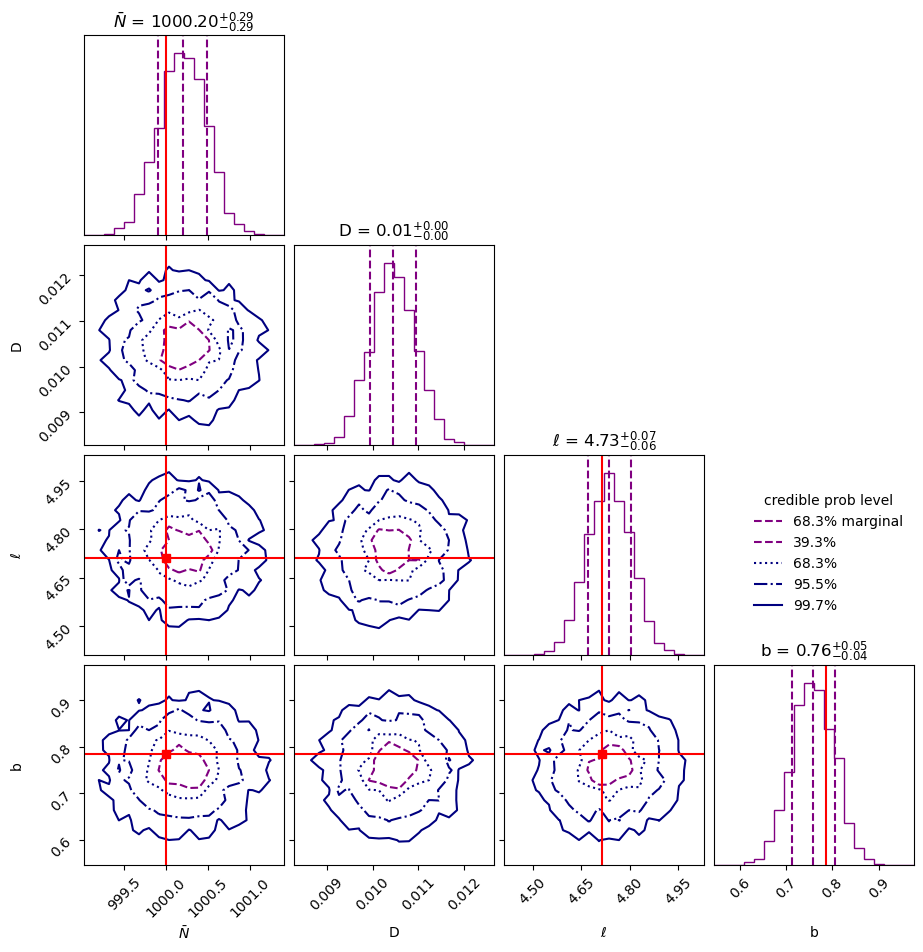

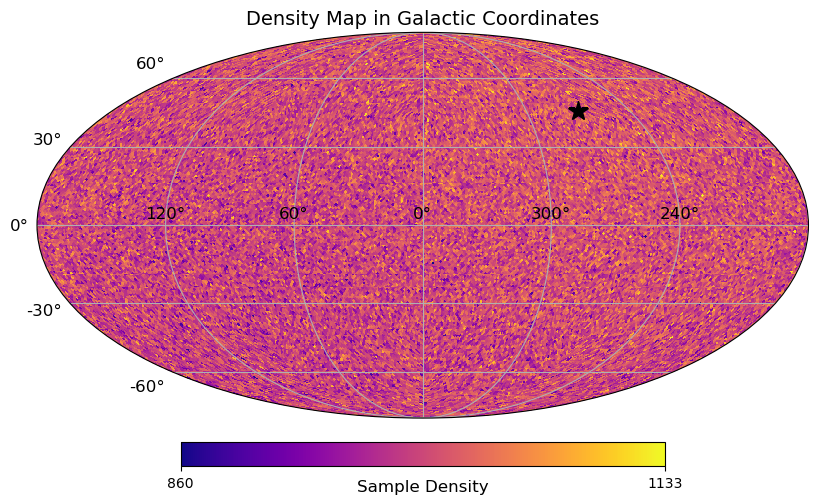

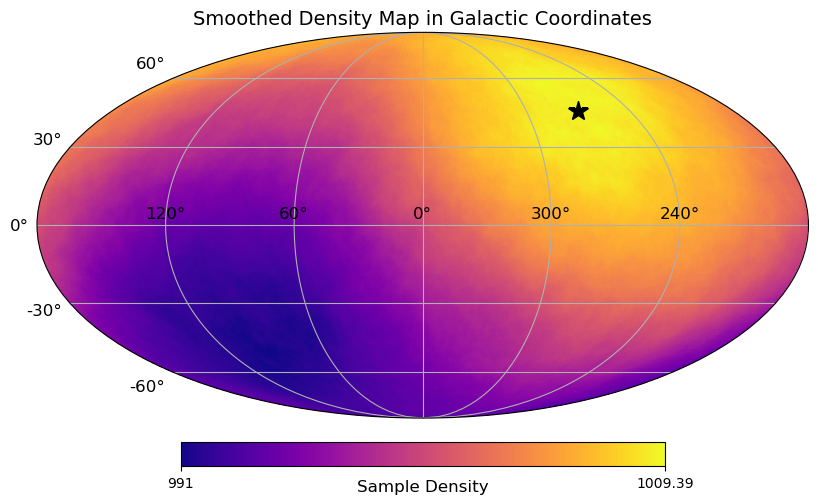

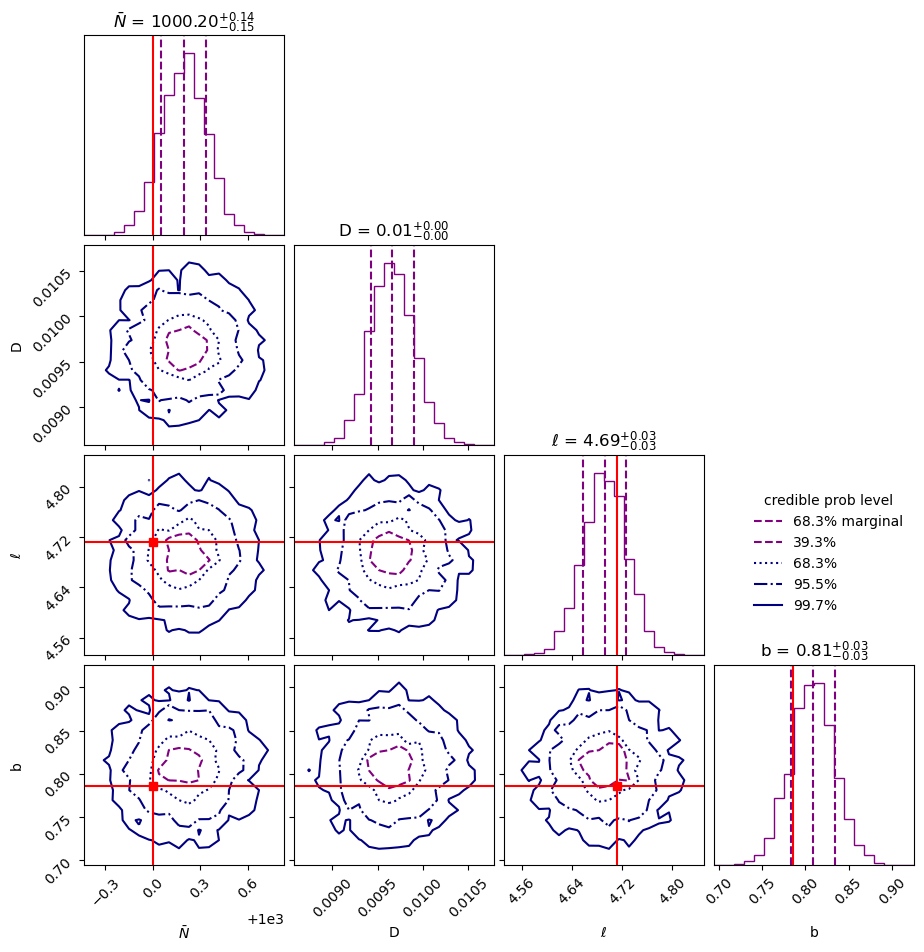

In [256]:
np.random.seed(42)
resolutions = [8,16,32,64]
N_bar_true = 1000
for NSIDE in resolutions:
    NPIX = hp.nside2npix(NSIDE)
    m, lambda_true_array = poisson_sampling(NSIDE=NSIDE,  N_bar=N_bar_true, D=0.01, dipole_theta=np.pi/4, dipole_phi=-np.pi/2)

    #Unsmoothed
    plotting(m, dipole_theta, dipole_phi,
             title='Density Map in Galactic Coordinates', unit="Sample Density",
            cmap='plasma')
    plt.savefig('../Figures/dipole_distribution_nside_{:s}.png'.format(str(NSIDE)), dpi=300)
    smoothed_map = compute_smooth_map(m, weights=None, angle_scale=1)

    plotting(smoothed_map, dipole_theta, dipole_phi,
             title='Smoothed Density Map in Galactic Coordinates', unit="Sample Density",
            cmap='plasma')
    plt.savefig('../Figures/smoothed_dipole_distribution_nside_{:s}.png'.format(str(NSIDE)), dpi=300)
    
    sampler = ultranest.ReactiveNestedSampler(param_names, my_likelihood, my_prior_transform)
    result = sampler.run()
    
    cornerplot(result, truths=[N_bar_true, D_true, -dipole_phi+np.pi, dipole_theta], truth_color='r')
    plt.savefig('../Figures/nside_{:s}_dipole_cornerplots.png'.format(str(NSIDE)), dpi=300)

### $\bar N $ :

[ultranest] Sampling 400 live points from prior ...


[ultranest] Explored until L=-1e+05  ..-125842.00 [-125842.1771..-125842.1770]*| it/evals=6892/16428 eff=42.9998% N=400 
[ultranest] Likelihood function evaluations: 16433
[ultranest]   logZ = -1.259e+05 +- 0.1437
[ultranest] Effective samples strategy satisfied (ESS = 1998.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.04 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.14, need <0.5)
[ultranest]   logZ error budget: single: 0.16 bs:0.14 tail:0.01 total:0.14 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 400 live points from prior ...


[ultranest] Explored until L=-1e+05  ..-142929.61 [-142929.7574..-142929.7573]*| it/evals=7622/17760 eff=43.9055% N=400 
[ultranest] Likelihood function evaluations: 17773
[ultranest]   logZ = -1.429e+05 +- 0.1463
[ultranest] Effective samples strategy satisfied (ESS = 2162.5, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.15, need <0.5)
[ultranest]   logZ error budget: single: 0.18 bs:0.15 tail:0.01 total:0.15 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 400 live points from prior ...


[ultranest] Explored until L=-2e+05  ..-153255.28 [-153255.4383..-153255.4378]*| it/evals=7692/18053 eff=43.5733% N=400 
[ultranest] Likelihood function evaluations: 18060
[ultranest]   logZ = -1.533e+05 +- 0.1547
[ultranest] Effective samples strategy satisfied (ESS = 2223.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.06 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.16, need <0.5)
[ultranest]   logZ error budget: single: 0.18 bs:0.15 tail:0.01 total:0.16 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 400 live points from prior ...


[ultranest] Explored until L=-2e+05  ..-160184.98 [-160185.1260..-160185.1258]*| it/evals=8080/19257 eff=42.8488% N=400 
[ultranest] Likelihood function evaluations: 19260
[ultranest]   logZ = -1.602e+05 +- 0.1608
[ultranest] Effective samples strategy satisfied (ESS = 2116.2, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.16, need <0.5)
[ultranest]   logZ error budget: single: 0.18 bs:0.16 tail:0.01 total:0.16 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 400 live points from prior ...


[ultranest] Explored until L=-2e+05  ..-165691.72 [-165691.8635..-165691.8635]*| it/evals=7996/19457 eff=41.9583% N=400 
[ultranest] Likelihood function evaluations: 19467
[ultranest]   logZ = -1.657e+05 +- 0.114
[ultranest] Effective samples strategy satisfied (ESS = 2128.8, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.07 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.11, need <0.5)
[ultranest]   logZ error budget: single: 0.18 bs:0.11 tail:0.01 total:0.11 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 400 live points from prior ...


[ultranest] Explored until L=-2e+05  ..-182623.77 [-182623.9110..-182623.9107]*| it/evals=8222/20450 eff=41.0075% N=400  
[ultranest] Likelihood function evaluations: 20456
[ultranest]   logZ = -1.826e+05 +- 0.1444
[ultranest] Effective samples strategy satisfied (ESS = 2119.5, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.07 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.14, need <0.5)
[ultranest]   logZ error budget: single: 0.19 bs:0.14 tail:0.01 total:0.14 required:<0.50
[ultranest] done iterating.


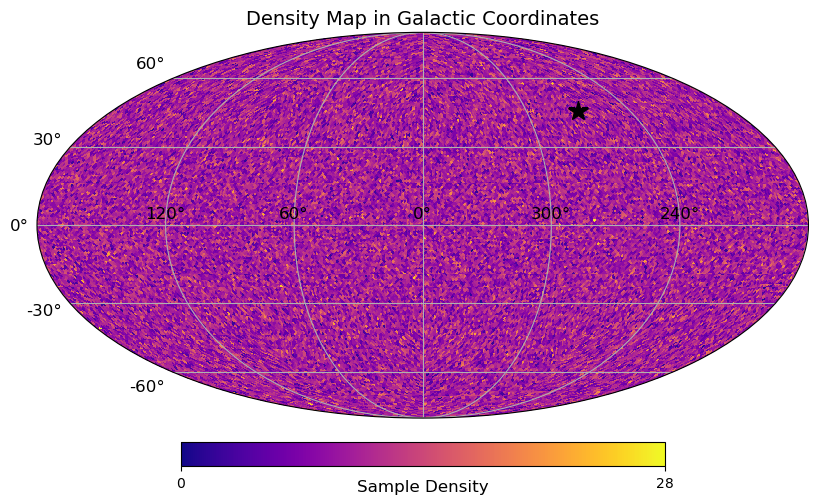

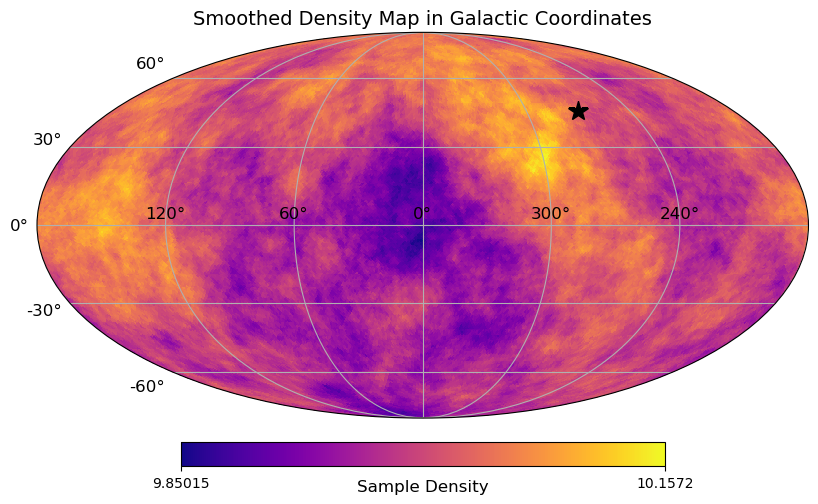

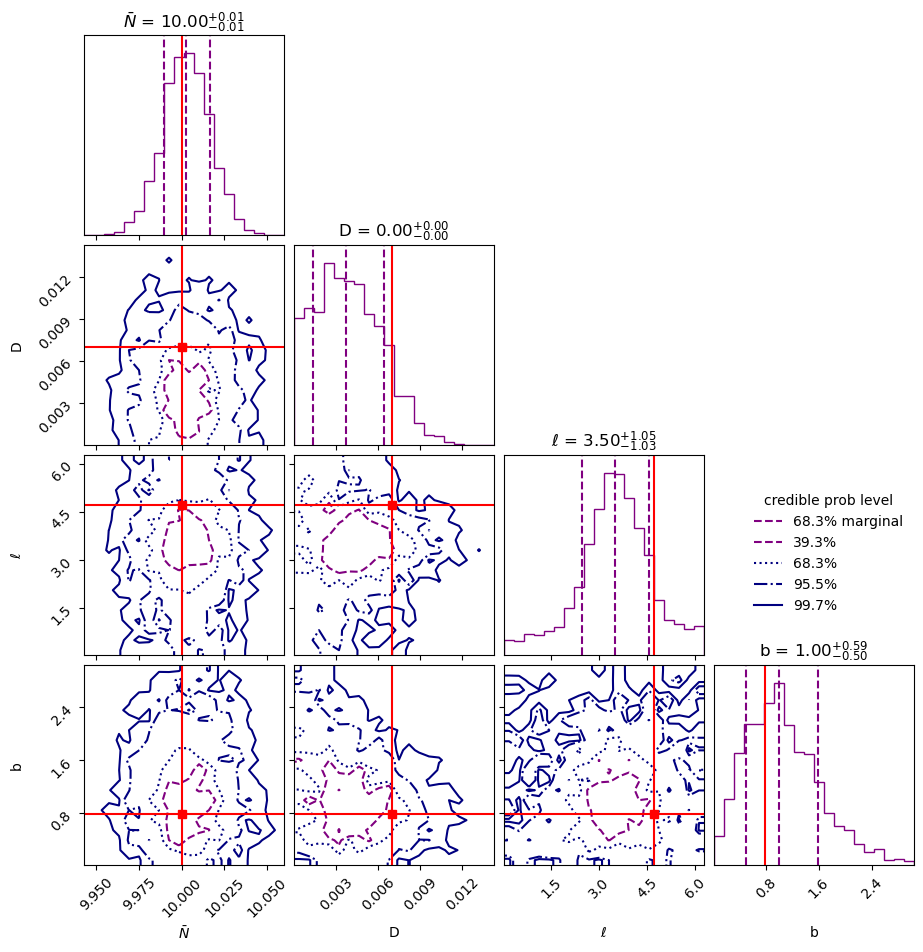

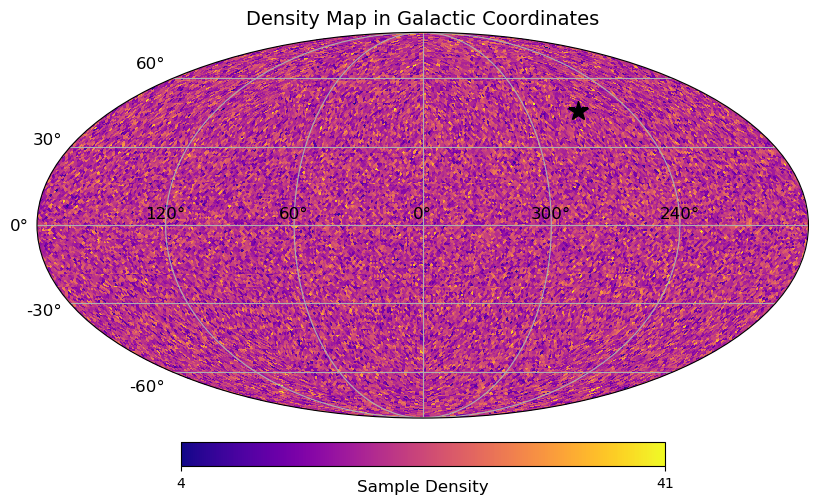

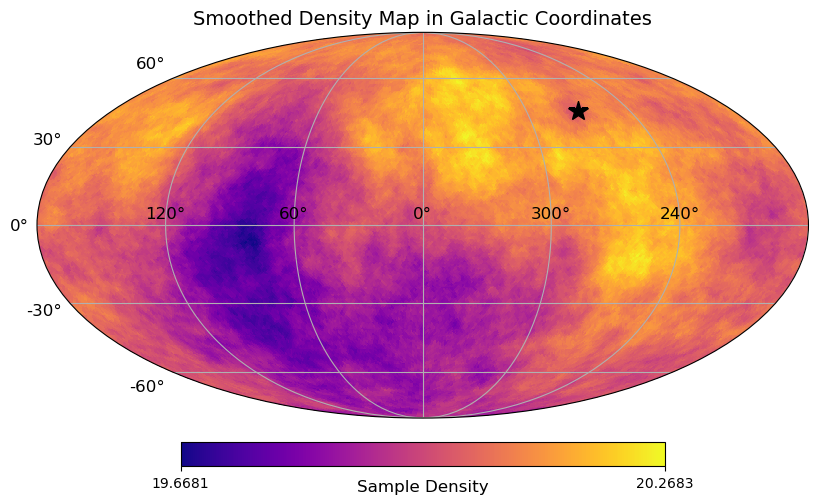

...

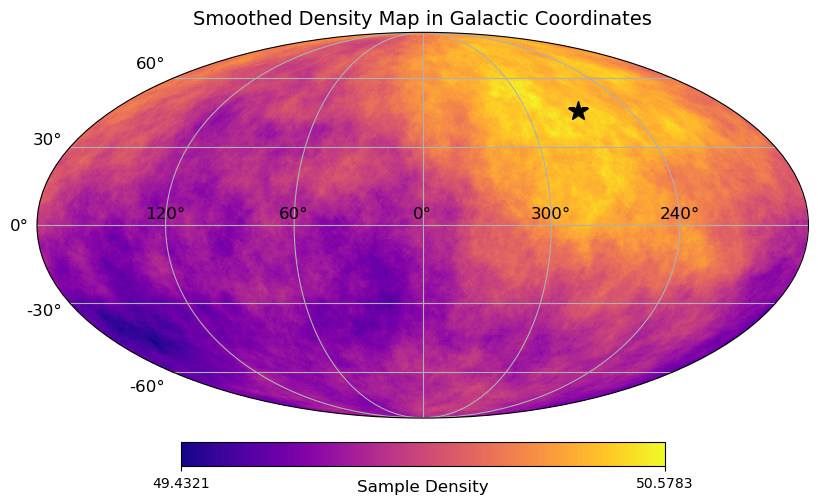

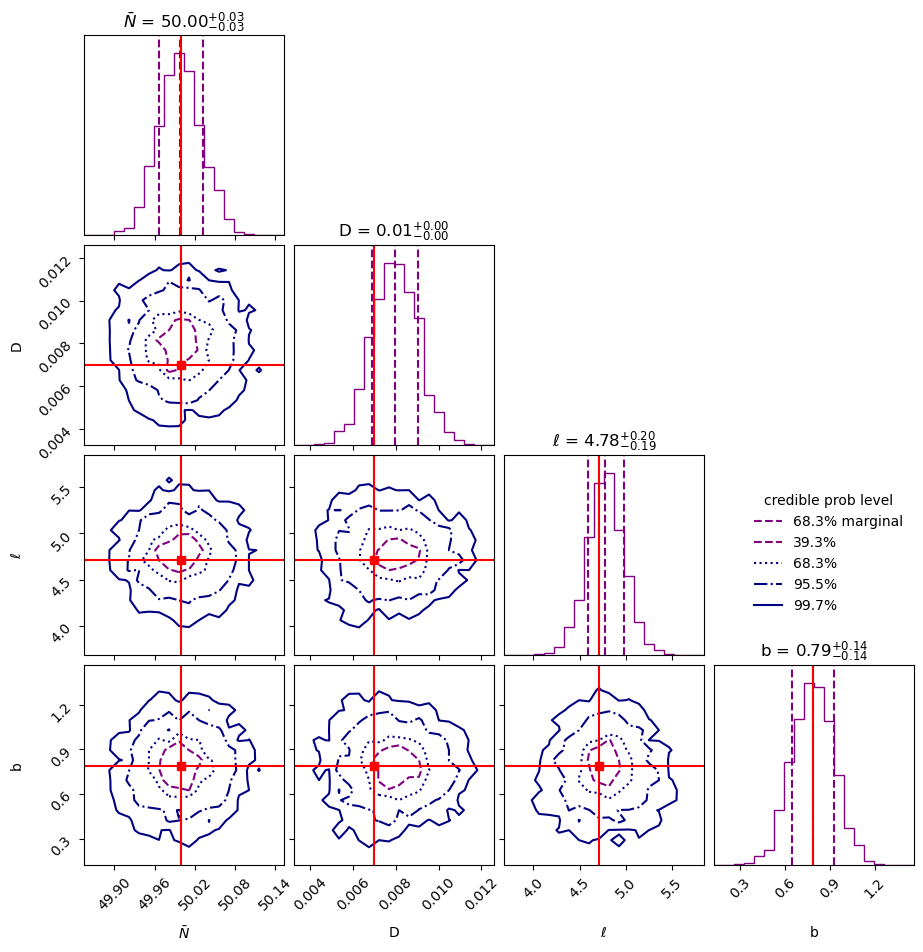

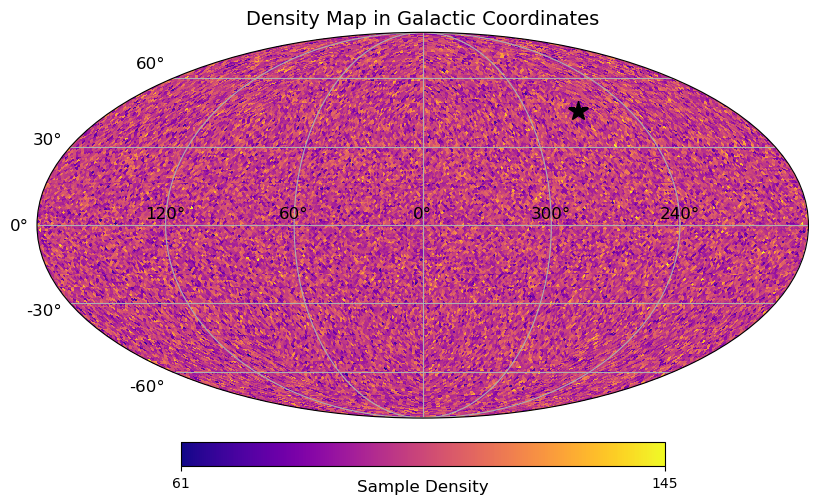

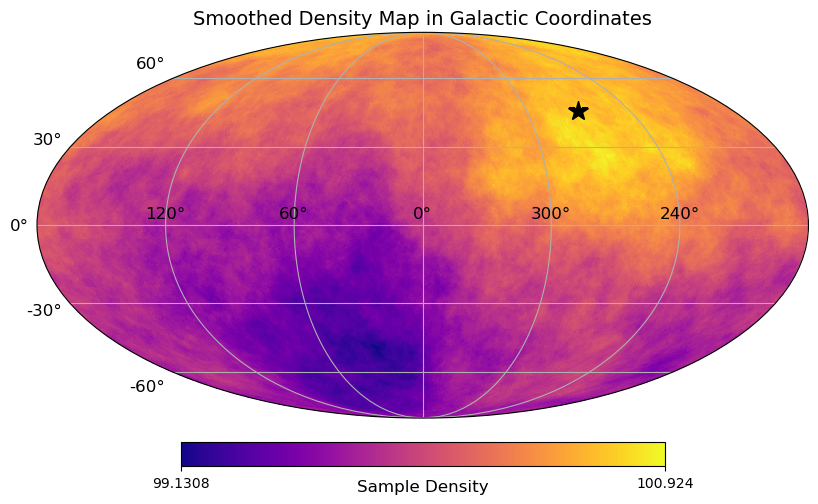

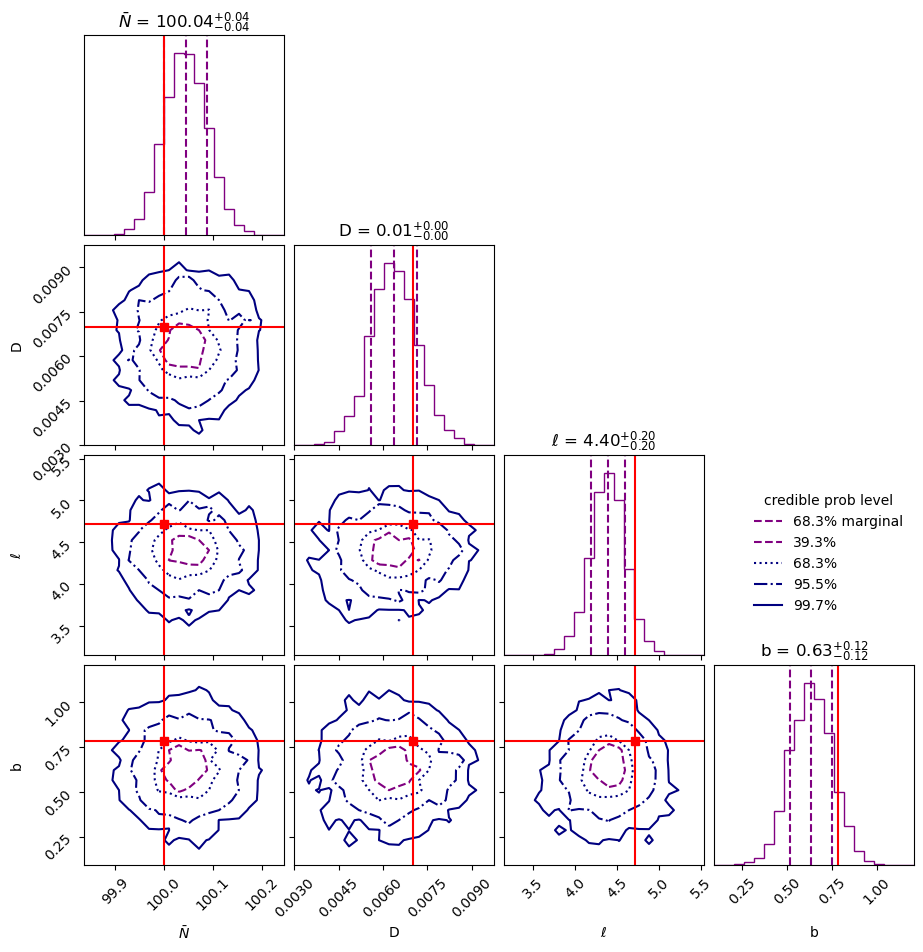

In [251]:
np.random.seed(42)
densities = [10,20,30,40,50,100]
NSIDE=64
for N_bar_true in densities:
    NPIX = hp.nside2npix(NSIDE)
    m, lambda_true_array = poisson_sampling(NSIDE=NSIDE,  N_bar=N_bar_true, D=0.007, dipole_theta=np.pi/4, dipole_phi=-np.pi/2)

    #Unsmoothed
    plotting(m, dipole_theta, dipole_phi,
             title='Density Map in Galactic Coordinates', unit="Sample Density",
            cmap='plasma')
    plt.savefig('../Figures/dipole_distribution_Nbar_{:s}.png'.format(str(N_bar_true)), dpi=300)
    smoothed_map = compute_smooth_map(m, weights=None, angle_scale=1)

    plotting(smoothed_map, dipole_theta, dipole_phi,
             title='Smoothed Density Map in Galactic Coordinates', unit="Sample Density",
            cmap='plasma')
    plt.savefig('../Figures/smoothed_dipole_distribution_Nbar_{:s}.png'.format(str(N_bar_true)), dpi=300)
    
    sampler = ultranest.ReactiveNestedSampler(param_names, my_likelihood, my_prior_transform)
    result = sampler.run()
    
    cornerplot(result, truths=[N_bar_true, D_true, -dipole_phi+np.pi, dipole_theta], truth_color='r')
    plt.savefig('../Figures/Nbar_{:s}_dipole_cornerplots.png'.format(str(N_bar_true)), dpi=300)